   # Stock Risk Analysis - Portfolio Suggestion

## Introduction about The Project

In a fast moving world, everybody busy with the work or business. A human cannot focus multiple things at one time. Even if we do, It wont be as efficient as focusing one particular task. Everybody wants to create wealth, But they cant find time to do the analysis to make the investment decisions. Thats where we are stepping in and helping our clients to give suggestions to make investment decision.

#### Wealth Creation

In the process of creating wealth, we should have a goal, And We need to ask few basic question.

Like, which domain we would like to invest in?<br> In this case, We chose the stock market.
How much we are ready to invest in?<br>
How much returns we are expecting from our portfolio?<br>
What is the risk percentage of our stocks?<br>

So, In this project, We are choosing stocks from S&P 500 index. We chose 5 Industry sectors like,

1.Travel/Aviation/Hospitality    
2.Banking/Financial Services and Insurance  
3.Pharmaceuticals/Healthcare/Life Sciences    
4.Technology/IT  

And, We chose 6 stocks from each industry. Using these we need to create stock portfolio according to client needs.


## About our Client

We are asked to give stock porfolio suggestions for two clients. We need to understand our clients investment preferences and persona.

1. **Mr. Patrick Jyengar**

He is a running a business named 'Jyengar Water Works'(JWW). He is a successful entrepreneur.

**Financial Situation**:<br>He is planning to invest on 1 million dollar. 500K dollars in a magazine name naturo for minority stake. The remaining 500K dollars into a low risk equities.

**Investing Style**:<br>He is always been a conservative investor. He always look for low risk investment oppurtunities.


**Goal**:<br>He expects a stock portfolio to doubling his capital with less risk in 5 years time. 500K Dollars --> 1 Million Dollars



2. **Mr. Peter Jyengar**

He is son of Mr.Peter Jyengar, Inheritor, Risk-Taker, He is aggressive in expanding his Production & Marketing efforts.

**Financial Situation**:<br> He is planning to invest 1 million dollar.  He is financially secure given by the successful business by his father.

**Investing Style**:<br> High risk taker - Aggressive because of that he believes he can still have time to bounce back incase of any occasional losses.

**Goal**:<br> Expecting High returns within 5 years time for inorganic growth of JWW.



So yeah, Our we are going to analyse the stocks past 5 year close prices. Most Importantly, We are going to calculate some metrics like,

1. Normalised Prices<br>
2. Relative Strength<br>
3. Daily Returns<br>
4. Mean<br>
5. Standard Deviation (Risk)<br>
6. Annualised Return<br>
7. Annualised Risk<br>
8. Cumulative return<br>
9. Sharpe ratio<br>

And Mostly importantly suggesting portfolio to our clients.

Okay, Lets do the real work. before we start, Lets import the necessary libraries. 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.express as px
import plotly.offline as pyo
import plotly.graph_objects as go

import warnings
warnings.filterwarnings('ignore')

I extracted the close price of all 24 stocks along with S&P Index & load it into excel sheet, And Calling it here for display. We are going to analyse these information.

In [2]:
df = pd.read_csv('stockcloseprice.csv')
df.head(10)

,Date,S&P,AAL,ALGT,ALK,DAL,HA,LUV,BCS,CS,...,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
0,10/1/2015,1923.82,39.20,217.98,80.23,45.41,24.73,38.41,15.01,24.09,...,49.37,31.84,33.22,116.61,27.40,520.72,90.95,611.29,143.59,44.61
1,10/2/2015,1951.36,38.63,215.59,79.26,44.87,24.28,38.38,15.39,24.64,...,50.14,33.08,33.32,118.83,27.59,532.54,92.07,626.91,144.58,45.57
2,10/5/2015,1987.05,40.19,216.06,80.91,46.96,25.50,39.30,15.60,25.16,...,51.23,33.48,33.44,119.65,27.70,543.68,94.01,641.47,149.04,46.63
3,10/6/2015,1979.92,38.13,208.60,74.53,45.09,24.25,38.00,15.55,25.38,...,49.80,32.79,33.53,116.05,27.83,537.48,92.80,645.44,148.78,46.75
4,10/7/2015,1995.83,39.31,213.84,75.97,45.99,24.56,38.71,15.73,25.32,...,50.95,33.29,32.55,116.43,27.70,541.94,92.40,642.36,150.09,46.80
5,10/8/2015,2013.43,39.74,212.66,75.76,45.96,26.09,38.76,15.81,24.53,...,51.02,33.09,33.25,116.08,27.38,533.16,92.47,639.16,152.28,47.45
6,10/9/2015,2014.89,42.42,217.68,75.92,47.21,27.29,39.94,15.71,24.77,...,50.95,33.24,32.86,119.27,28.03,539.80,93.24,643.61,152.39,47.11
7,10/12/2015,2017.46,43.84,227.86,77.99,48.50,28.13,41.22,15.73,25.08,...,50.71,33.22,33.00,122.51,27.90,550.19,94.26,646.67,151.14,47.00
8,10/13/2015,2003.69,43.41,218.93,73.92,47.73,28.29,40.82,15.16,24.78,...,49.47,32.98,33.18,123.99,27.95,548.90,94.12,652.30,149.62,46.89
9,10/14/2015,1994.24,43.80,214.83,73.45,48.59,27.81,40.84,15.11,24.81,...,49.54,33.04,33.02,122.07,27.55,544.83,94.07,651.16,150.01,46.68


In [3]:
df.tail(10)

,Date,S&P,AAL,ALGT,ALK,DAL,HA,LUV,BCS,CS,...,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
1249,9/17/2020,3357.01,13.63,138.51,42.15,33.96,14.72,40.40,5.19,10.98,...,85.64,36.82,46.36,304.98,110.34,3008.73,254.82,1495.53,124.92,202.91
1250,9/18/2020,3319.47,13.19,134.50,41.04,32.84,14.17,39.83,5.02,10.68,...,85.81,36.63,46.84,308.02,106.84,2954.91,252.53,1459.99,122.76,200.39
1251,9/21/2020,3281.06,12.21,126.34,37.64,29.82,13.11,37.52,4.74,10.08,...,83.13,36.02,46.30,299.19,110.08,2960.47,248.15,1431.16,120.25,202.54
1252,9/22/2020,3315.57,12.34,126.88,37.88,30.22,13.22,38.12,4.68,9.91,...,82.94,36.25,46.31,294.26,111.81,3128.99,254.75,1465.46,120.51,207.42
1253,9/23/2020,3236.92,11.93,125.48,36.86,29.56,12.81,37.55,4.64,9.68,...,82.63,36.00,44.86,292.14,107.12,2999.86,249.02,1415.21,118.83,200.59
1254,9/24/2020,3246.59,11.77,121.50,35.70,29.01,12.40,36.86,4.75,9.62,...,83.15,35.76,44.70,292.66,108.22,3019.79,249.53,1428.29,118.09,203.19
1255,9/25/2020,3298.46,12.29,123.76,36.70,29.78,12.80,37.10,4.70,9.48,...,82.93,36.05,44.82,302.50,112.28,3095.13,254.82,1444.96,118.95,207.82
1256,9/28/2020,3351.60,12.76,127.11,37.54,31.34,13.38,38.24,4.99,9.90,...,82.76,36.39,44.11,303.23,114.96,3174.05,256.82,1464.52,121.73,209.44
1257,9/29/2020,3335.47,12.25,121.09,36.67,30.61,12.86,37.61,4.96,9.83,...,81.90,36.17,43.37,304.15,114.09,3144.88,261.79,1469.33,120.94,207.26
1258,9/30/2020,3363.00,12.29,119.80,36.63,30.58,12.89,37.50,5.01,9.97,...,82.95,36.70,42.81,311.77,115.81,3148.73,261.90,1469.60,121.67,210.33


In [4]:
df['Date'] =  pd.to_datetime(df['Date'])
df.head()

,Date,S&P,AAL,ALGT,ALK,DAL,HA,LUV,BCS,CS,...,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
0,2015-10-01,1923.82,39.20,217.98,80.23,45.41,24.73,38.41,15.01,24.09,...,49.37,31.84,33.22,116.61,27.40,520.72,90.95,611.29,143.59,44.61
1,2015-10-02,1951.36,38.63,215.59,79.26,44.87,24.28,38.38,15.39,24.64,...,50.14,33.08,33.32,118.83,27.59,532.54,92.07,626.91,144.58,45.57
2,2015-10-05,1987.05,40.19,216.06,80.91,46.96,25.50,39.30,15.60,25.16,...,51.23,33.48,33.44,119.65,27.70,543.68,94.01,641.47,149.04,46.63
3,2015-10-06,1979.92,38.13,208.60,74.53,45.09,24.25,38.00,15.55,25.38,...,49.80,32.79,33.53,116.05,27.83,537.48,92.80,645.44,148.78,46.75
4,2015-10-07,1995.83,39.31,213.84,75.97,45.99,24.56,38.71,15.73,25.32,...,50.95,33.29,32.55,116.43,27.70,541.94,92.40,642.36,150.09,46.80


In [5]:
df['Date'] =  pd.to_datetime(df['Date'], format = "%Y-%m")
df.head()

,Date,S&P,AAL,ALGT,ALK,DAL,HA,LUV,BCS,CS,...,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
0,2015-10-01,1923.82,39.20,217.98,80.23,45.41,24.73,38.41,15.01,24.09,...,49.37,31.84,33.22,116.61,27.40,520.72,90.95,611.29,143.59,44.61
1,2015-10-02,1951.36,38.63,215.59,79.26,44.87,24.28,38.38,15.39,24.64,...,50.14,33.08,33.32,118.83,27.59,532.54,92.07,626.91,144.58,45.57
2,2015-10-05,1987.05,40.19,216.06,80.91,46.96,25.50,39.30,15.60,25.16,...,51.23,33.48,33.44,119.65,27.70,543.68,94.01,641.47,149.04,46.63
3,2015-10-06,1979.92,38.13,208.60,74.53,45.09,24.25,38.00,15.55,25.38,...,49.80,32.79,33.53,116.05,27.83,537.48,92.80,645.44,148.78,46.75
4,2015-10-07,1995.83,39.31,213.84,75.97,45.99,24.56,38.71,15.73,25.32,...,50.95,33.29,32.55,116.43,27.70,541.94,92.40,642.36,150.09,46.80


This is time series data, So we are setting date column as index for our analysis.

In [6]:
df = df.set_index('Date')
df.head()

,S&P,AAL,ALGT,ALK,DAL,HA,LUV,BCS,CS,DB,...,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,
2015-10-01,1923.82,39.20,217.98,80.23,45.41,24.73,38.41,15.01,24.09,26.52,...,49.37,31.84,33.22,116.61,27.40,520.72,90.95,611.29,143.59,44.61
2015-10-02,1951.36,38.63,215.59,79.26,44.87,24.28,38.38,15.39,24.64,27.14,...,50.14,33.08,33.32,118.83,27.59,532.54,92.07,626.91,144.58,45.57
2015-10-05,1987.05,40.19,216.06,80.91,46.96,25.50,39.30,15.60,25.16,28.20,...,51.23,33.48,33.44,119.65,27.70,543.68,94.01,641.47,149.04,46.63
2015-10-06,1979.92,38.13,208.60,74.53,45.09,24.25,38.00,15.55,25.38,28.40,...,49.80,32.79,33.53,116.05,27.83,537.48,92.80,645.44,148.78,46.75
2015-10-07,1995.83,39.31,213.84,75.97,45.99,24.56,38.71,15.73,25.32,28.79,...,50.95,33.29,32.55,116.43,27.70,541.94,92.40,642.36,150.09,46.80


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1259 entries, 2015-10-01 to 2020-09-30
Data columns (total 25 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   S&P     1259 non-null   float64
 1   AAL     1259 non-null   float64
 2   ALGT    1259 non-null   float64
 3   ALK     1259 non-null   float64
 4   DAL     1259 non-null   float64
 5   HA      1259 non-null   float64
 6   LUV     1259 non-null   float64
 7   BCS     1259 non-null   float64
 8   CS      1259 non-null   float64
 9   DB      1259 non-null   float64
 10  GS      1259 non-null   float64
 11  MS      1259 non-null   float64
 12  WFC     1259 non-null   float64
 13  BHC     1259 non-null   float64
 14  JNJ     1259 non-null   float64
 15  MRK     1259 non-null   float64
 16  PFE     1259 non-null   float64
 17  RHHBY   1259 non-null   float64
 18  UNH     1259 non-null   float64
 19  AAPL    1259 non-null   float64
 20  AMZN    1259 non-null   float64
 21  FB      1259 non-nu

In the above result, Its evident that we have no null values, We can start our analysis.

In [8]:
df.describe()

,S&P,AAL,ALGT,ALK,DAL,HA,LUV,BCS,CS,DB,...,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
count,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,...,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000,1259.000000
mean,2608.429929,36.393948,144.722939,66.828475,48.221382,35.277379,49.521064,9.315425,14.130778,13.593384,...,68.029102,36.290810,33.511231,213.125179,47.080675,1426.990627,163.611136,1040.788451,143.654782,102.185083
std,394.738077,11.486983,24.906476,15.353956,9.378341,11.350796,8.832897,2.187170,3.239365,5.322866,...,11.550949,3.814801,4.664290,59.429501,20.992778,668.360390,40.045767,241.600734,15.163878,45.758418
min,1829.080000,9.040000,66.230000,23.560000,19.190000,8.630000,23.870000,3.840000,6.670000,5.480000,...,48.590000,28.490000,26.390000,109.230000,22.580000,482.070000,90.950000,611.290000,94.770000,44.610000
25%,2264.485000,30.360000,130.075000,61.635000,45.275000,27.805000,42.415000,8.110000,11.995000,8.695000,...,58.660000,33.465000,30.630000,160.570000,29.825000,818.120000,129.150000,797.460000,134.325000,62.660000
50%,2656.300000,37.950000,144.000000,66.150000,50.340000,36.900000,51.880000,9.330000,13.740000,13.470000,...,64.090000,35.770000,32.040000,226.640000,42.960000,1500.000000,167.240000,1055.810000,144.240000,93.920000
75%,2888.265000,45.105000,162.590000,75.765000,54.745000,42.845000,55.935000,10.780000,15.500000,17.440000,...,79.380000,38.330000,34.470000,259.750000,53.870000,1828.790000,186.895000,1196.440000,153.420000,135.220000
max,3580.840000,58.470000,227.860000,100.240000,63.160000,60.300000,66.290000,15.810000,25.960000,30.750000,...,92.040000,46.230000,46.840000,323.700000,134.180000,3531.450000,303.910000,1728.280000,181.950000,231.650000


In [9]:
df.shape

(1259, 25)

This is just overview and the spread of all stocks that we are going to do the analysis. We will explore every stocks in industry wise analysis.

In [10]:
fig_AllStocks = px.line(df, x=df.index, y=df.columns, color='variable')
fig_AllStocks

#### Normalized Prices of all stocks

By normalising the vlosing prices, We identify the uptrend stocks for last five years. If the stock last normalised close price above 1.0, That stock considered as important stock to consider in our portfolio.

Its just an overview. Its slightly not clear now, We are going to see clear view while we do the industry wise analysis.

In [11]:
NP = df.div(df.iloc[0])
NP.head(10)

,S&P,AAL,ALGT,ALK,DAL,HA,LUV,BCS,CS,DB,...,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,
2015-10-01,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
2015-10-02,1.014315,0.985459,0.989036,0.987910,0.988108,0.981803,0.999219,1.025316,1.022831,1.023379,...,1.015597,1.038945,1.003010,1.019038,1.006934,1.022699,1.012314,1.025553,1.006895,1.021520
2015-10-05,1.032867,1.025255,0.991192,1.008476,1.034133,1.031136,1.023171,1.039307,1.044417,1.063348,...,1.037675,1.051508,1.006623,1.026070,1.010949,1.044093,1.033645,1.049371,1.037955,1.045281
2015-10-06,1.029161,0.972704,0.956969,0.928954,0.992953,0.980590,0.989326,1.035976,1.053549,1.070890,...,1.008710,1.029837,1.009332,0.995198,1.015693,1.032186,1.020341,1.055865,1.036145,1.047971
2015-10-07,1.037431,1.002806,0.981007,0.946903,1.012773,0.993126,1.007810,1.047968,1.051059,1.085596,...,1.032003,1.045540,0.979831,0.998456,1.010949,1.040751,1.015943,1.050827,1.045268,1.049092
2015-10-08,1.046579,1.013776,0.975594,0.944285,1.012112,1.054994,1.009112,1.053298,1.018265,1.070513,...,1.033421,1.039259,1.000903,0.995455,0.999270,1.023890,1.016712,1.045592,1.060520,1.063663
2015-10-09,1.047338,1.082143,0.998624,0.946279,1.039639,1.103518,1.039833,1.046636,1.028227,1.106335,...,1.032003,1.043970,0.989163,1.022811,1.022993,1.036642,1.025179,1.052872,1.061286,1.056041
2015-10-12,1.048674,1.118367,1.045325,0.972080,1.068047,1.137485,1.073158,1.047968,1.041096,1.098793,...,1.027142,1.043342,0.993377,1.050596,1.018248,1.056595,1.036394,1.057878,1.052580,1.053575
2015-10-13,1.041516,1.107398,1.004358,0.921351,1.051090,1.143955,1.062744,1.009993,1.028643,1.085219,...,1.002026,1.035804,0.998796,1.063288,1.020073,1.054117,1.034854,1.067088,1.041995,1.051110


In [12]:
fig_NP = px.line(NP, x=NP.index, y=NP.columns, color='variable')
fig_NP

#### Relative Strength of all stocks

**Relative strength** analysis, It is basically to see how all stocks are performing against S&P index. We are considering S&P index for risk. S&P Index is considered to be a market risk, since all the stocks are picked from that index.

In [13]:
RS = df.iloc[:, :25].div(df['S&P'], axis=0)
RS.head()

,S&P,AAL,ALGT,ALK,DAL,HA,LUV,BCS,CS,DB,...,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,
2015-10-01,1.0,0.020376,0.113306,0.041703,0.023604,0.012855,0.019965,0.007802,0.012522,0.013785,...,0.025662,0.016550,0.017268,0.060614,0.014242,0.270670,0.047276,0.317748,0.074638,0.023188
2015-10-02,1.0,0.019796,0.110482,0.040618,0.022994,0.012443,0.019668,0.007887,0.012627,0.013908,...,0.025695,0.016952,0.017075,0.060896,0.014139,0.272907,0.047182,0.321268,0.074092,0.023353
2015-10-05,1.0,0.020226,0.108734,0.040719,0.023633,0.012833,0.019778,0.007851,0.012662,0.014192,...,0.025782,0.016849,0.016829,0.060215,0.013940,0.273612,0.047311,0.322825,0.075006,0.023467
2015-10-06,1.0,0.019258,0.105358,0.037643,0.022774,0.012248,0.019193,0.007854,0.012819,0.014344,...,0.025153,0.016561,0.016935,0.058613,0.014056,0.271466,0.046871,0.325993,0.075144,0.023612
2015-10-07,1.0,0.019696,0.107143,0.038064,0.023043,0.012306,0.019395,0.007881,0.012686,0.014425,...,0.025528,0.016680,0.016309,0.058337,0.013879,0.271536,0.046297,0.321851,0.075202,0.023449


In [14]:
fig_RS = px.line(RS, x=RS.index, y=RS.columns, color='variable')
fig_RS

#### Daily Returns - All stocks

Its important to know how much we are getting from each stock, each day. This will help us to find the cumulative return and expected return of the portfolio.

In [15]:
return_stocks = df.pct_change()
return_stocks.head(5)

,S&P,AAL,ALGT,ALK,DAL,HA,LUV,BCS,CS,DB,...,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,
2015-10-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-10-02,0.014315,-0.014541,-0.010964,-0.012090,-0.011892,-0.018197,-0.000781,0.025316,0.022831,0.023379,...,0.015597,0.038945,0.003010,0.019038,0.006934,0.022699,0.012314,0.025553,0.006895,0.021520
2015-10-05,0.018290,0.040383,0.002180,0.020818,0.046579,0.050247,0.023971,0.013645,0.021104,0.039057,...,0.021739,0.012092,0.003601,0.006901,0.003987,0.020919,0.021071,0.023225,0.030848,0.023261
2015-10-06,-0.003588,-0.051257,-0.034527,-0.078853,-0.039821,-0.049020,-0.033079,-0.003205,0.008744,0.007092,...,-0.027913,-0.020609,0.002691,-0.030088,0.004693,-0.011404,-0.012871,0.006189,-0.001744,0.002573
2015-10-07,0.008036,0.030947,0.025120,0.019321,0.019960,0.012784,0.018684,0.011576,-0.002364,0.013732,...,0.023092,0.015249,-0.029228,0.003274,-0.004671,0.008298,-0.004310,-0.004772,0.008805,0.001070


In [16]:
return_stocks.describe()

,S&P,AAL,ALGT,ALK,DAL,HA,LUV,BCS,CS,DB,...,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
count,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,...,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000
mean,0.000517,-0.000336,-0.000047,-0.000256,0.000042,0.000034,0.000245,-0.000548,-0.000437,-0.000529,...,0.000511,0.000209,0.000293,0.000941,0.001322,0.001611,0.001050,0.000834,-0.000002,0.001387
std,0.012080,0.034725,0.029101,0.026907,0.026478,0.033132,0.022913,0.025119,0.022842,0.027743,...,0.014067,0.013826,0.013514,0.017810,0.018730,0.018969,0.020354,0.016520,0.016086,0.017539
min,-0.119841,-0.252246,-0.283300,-0.232385,-0.259924,-0.264971,-0.151094,-0.218519,-0.182598,-0.174888,...,-0.088990,-0.077346,-0.089609,-0.172769,-0.128652,-0.079221,-0.189609,-0.111008,-0.128507,-0.147390
25%,-0.002938,-0.013623,-0.011305,-0.010721,-0.009714,-0.014908,-0.009222,-0.010787,-0.010442,-0.014976,...,-0.006240,-0.005856,-0.006237,-0.006644,-0.006240,-0.006716,-0.007223,-0.005788,-0.006498,-0.005893
50%,0.000682,-0.000480,-0.000363,0.000205,0.000783,0.000342,0.000617,0.000000,0.000000,-0.001051,...,0.000245,0.000115,0.000229,0.000809,0.000997,0.001636,0.001193,0.000973,0.000483,0.001225
75%,0.005213,0.013233,0.011630,0.010619,0.009781,0.015078,0.009990,0.010215,0.010416,0.013872,...,0.007616,0.006372,0.006919,0.008161,0.009879,0.010765,0.010880,0.008785,0.006878,0.009161
max,0.093828,0.410970,0.292428,0.203079,0.210171,0.245837,0.144441,0.151042,0.163447,0.140244,...,0.104080,0.089607,0.130118,0.127989,0.119723,0.132164,0.155214,0.104485,0.113010,0.142169


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000002050BC0B3A0>,
      dtype=object)

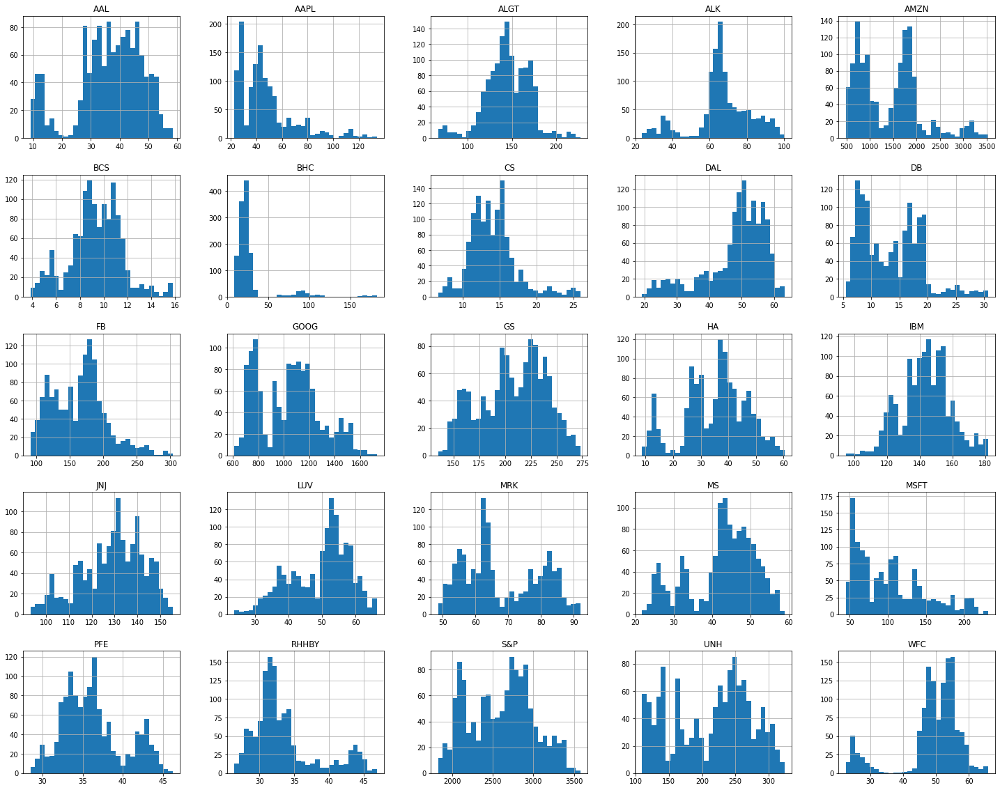

In [17]:
df.hist(bins=30, figsize=(25, 20))

In the above chart we can see which close price frequently fluctuated over the course of 5 years. We can assume the mean from this histogram charts.

#### Average Daily return from each stock

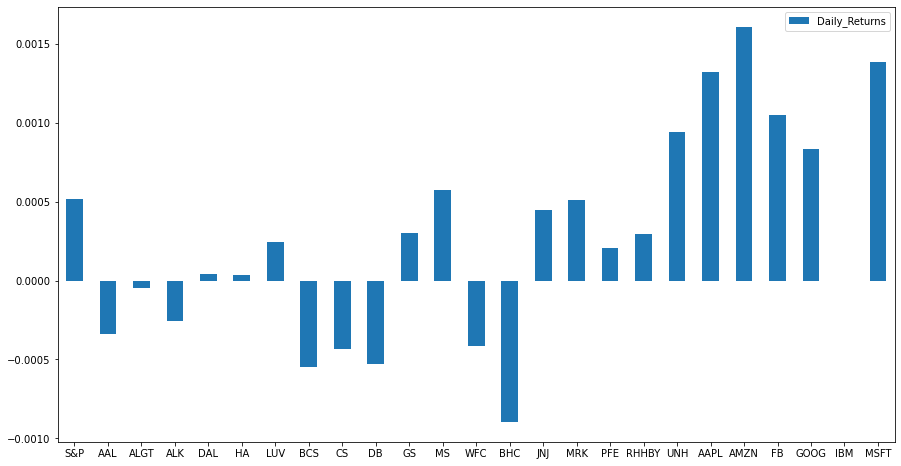

In [18]:
daily_returns_mean = return_stocks.mean()
dfdailyreturn = daily_returns_mean.to_frame()
dfdailyreturn.columns=["Daily_Returns"]
dfdailyreturn.to_excel(r'G:\Data Science - Upgrad\Final Result Dataset Imp\DailyReturnAll.xlsx')
DRchart = dfdailyreturn.plot.bar(y='Daily_Returns', rot=0,figsize=(15,8))

**Observation**:

Negative average return stocks = BHC,BCS,DB,CS,WFC,AAL,ALK<br>
Positive Average Return Stocks = AMZN,MSFT,AAPL,FB,UNH,GOOG,MS,MRK,JNJ,RHHBY,GS,LUV,PFE,DAL,HA,IBM

In [19]:
daily_returns_mean = return_stocks.mean()
Percent_dailyreturn = daily_returns_mean.round(decimals=5).astype(float).map("{:.2%}".format)
print(Percent_dailyreturn)

S&P       0.05%
AAL      -0.03%
ALGT     -0.01%
ALK      -0.03%
DAL       0.00%
HA        0.00%
LUV       0.02%
BCS      -0.06%
CS       -0.04%
DB       -0.05%
GS        0.03%
MS        0.06%
WFC      -0.04%
BHC      -0.09%
JNJ       0.04%
MRK       0.05%
PFE       0.02%
RHHBY     0.03%
UNH       0.09%
AAPL      0.13%
AMZN      0.16%
FB        0.10%
GOOG      0.08%
IBM      -0.00%
MSFT      0.14%
dtype: object


#### Lowest return of stocks in a day for given period

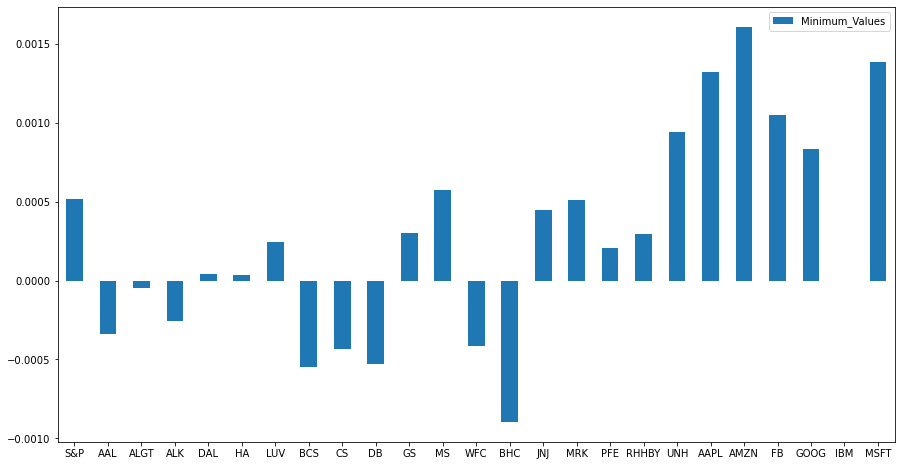

In [20]:
daily_returns_min = return_stocks.min()
dfdailyreturnmin = daily_returns_mean.to_frame()
dfdailyreturnmin.columns=["Minimum_Values"]
Minvalchart = dfdailyreturnmin.plot.bar(y='Minimum_Values', rot=0,figsize=(15,8))

In [21]:
Percent_dailyreturn_min = daily_returns_min.round(decimals=3).astype(float).map("{:.2%}".format)
Percent_dailyreturn_min

S&P      -12.00%
AAL      -25.20%
ALGT     -28.30%
ALK      -23.20%
DAL      -26.00%
HA       -26.50%
LUV      -15.10%
BCS      -21.90%
CS       -18.30%
DB       -17.50%
GS       -12.70%
MS       -15.60%
WFC      -15.90%
BHC      -51.50%
JNJ      -10.00%
MRK       -8.90%
PFE       -7.70%
RHHBY     -9.00%
UNH      -17.30%
AAPL     -12.90%
AMZN      -7.90%
FB       -19.00%
GOOG     -11.10%
IBM      -12.90%
MSFT     -14.70%
dtype: object

#### Highest return of stocks in a day for given period

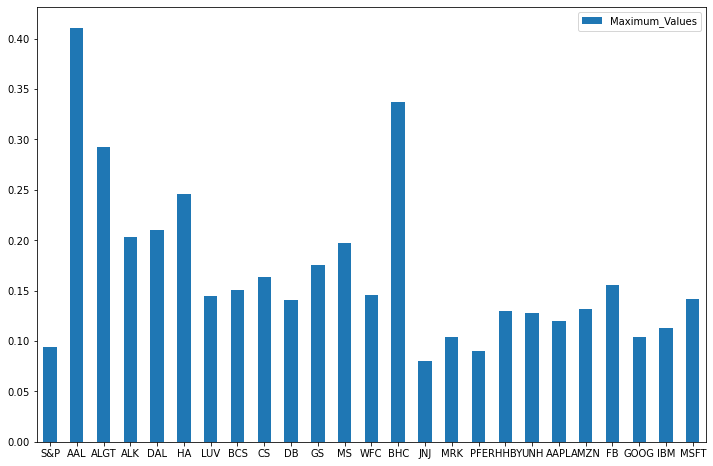

In [22]:
daily_returns_max = return_stocks.max()
dfdailyreturnmax = daily_returns_max.to_frame()
dfdailyreturnmax.columns=["Maximum_Values"]
Maxvalchart = dfdailyreturnmax.plot.bar(y='Maximum_Values', rot=0,figsize=(12,8))

In [23]:
Percent_dailyreturn_max = daily_returns_max.round(decimals=3).astype(float).map("{:.2%}".format)
Percent_dailyreturn_max

S&P       9.40%
AAL      41.10%
ALGT     29.20%
ALK      20.30%
DAL      21.00%
HA       24.60%
LUV      14.40%
BCS      15.10%
CS       16.30%
DB       14.00%
GS       17.60%
MS       19.80%
WFC      14.50%
BHC      33.70%
JNJ       8.00%
MRK      10.40%
PFE       9.00%
RHHBY    13.00%
UNH      12.80%
AAPL     12.00%
AMZN     13.20%
FB       15.50%
GOOG     10.40%
IBM      11.30%
MSFT     14.20%
dtype: object

#### Risk as per the daily return of all stocks

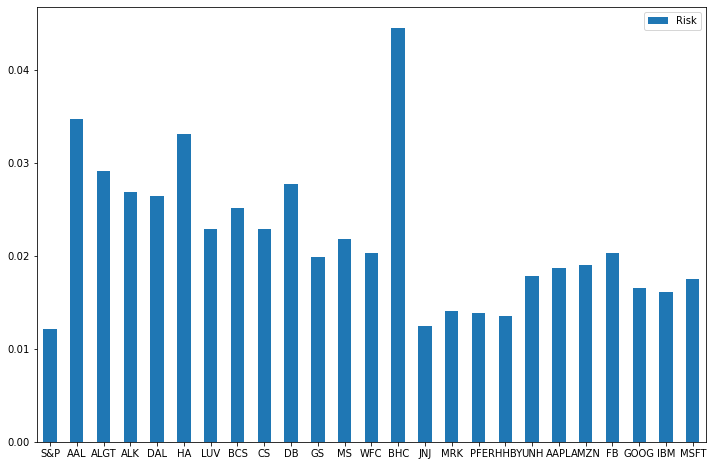

In [24]:
daily_returns_risk = return_stocks.std()
dfdailyreturnrisk = daily_returns_risk.to_frame()
dfdailyreturnrisk.columns=["Risk"]
riskvalchart = dfdailyreturnrisk.plot.bar(y='Risk', rot=0,figsize=(12,8))

In [25]:
Percent_dailyreturn_risk = daily_returns_risk.round(decimals=3).astype(float).map("{:.2%}".format)
Percent_dailyreturn_risk

S&P      1.20%
AAL      3.50%
ALGT     2.90%
ALK      2.70%
DAL      2.60%
HA       3.30%
LUV      2.30%
BCS      2.50%
CS       2.30%
DB       2.80%
GS       2.00%
MS       2.20%
WFC      2.00%
BHC      4.50%
JNJ      1.20%
MRK      1.40%
PFE      1.40%
RHHBY    1.40%
UNH      1.80%
AAPL     1.90%
AMZN     1.90%
FB       2.00%
GOOG     1.70%
IBM      1.60%
MSFT     1.80%
dtype: object

#### Annualized Returns

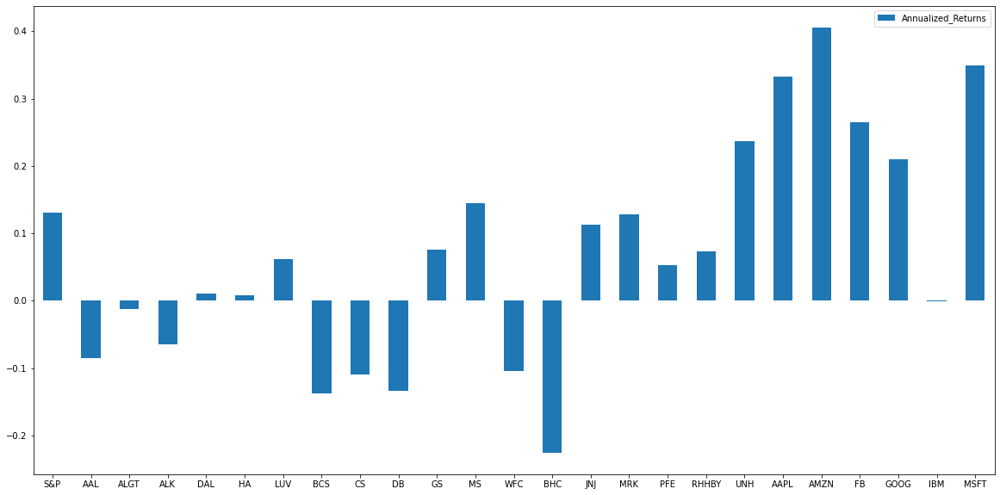

In [26]:
annualized_returns = 252*daily_returns_mean
dfannualizedreturn = annualized_returns.to_frame()
dfannualizedreturn.columns=["Annualized_Returns"]
ARvalchart = dfannualizedreturn.plot.bar(y='Annualized_Returns', rot=0,figsize=(20,10))

In [27]:
Percent_annualized_returns = annualized_returns.round(decimals=3).astype(float).map("{:.2%}".format)
Percent_annualized_returns

S&P       13.00%
AAL       -8.50%
ALGT      -1.20%
ALK       -6.40%
DAL        1.10%
HA         0.90%
LUV        6.20%
BCS      -13.80%
CS       -11.00%
DB       -13.30%
GS         7.60%
MS        14.60%
WFC      -10.40%
BHC      -22.60%
JNJ       11.40%
MRK       12.90%
PFE        5.30%
RHHBY      7.40%
UNH       23.70%
AAPL      33.30%
AMZN      40.60%
FB        26.50%
GOOG      21.00%
IBM       -0.00%
MSFT      35.00%
dtype: object

#### Annualized Risk

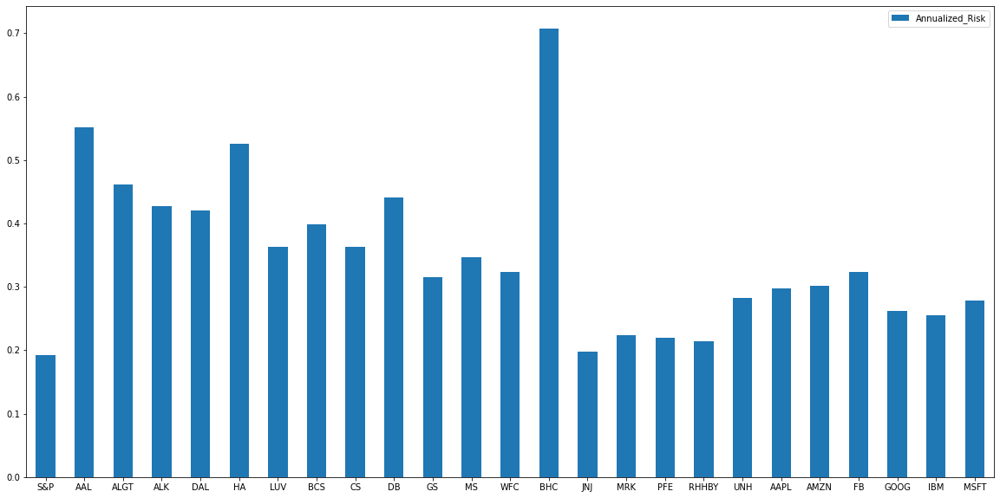

In [28]:
annualized_risk = daily_returns_risk*np.sqrt(252)
dfannualizedrisk = annualized_risk.to_frame()
dfannualizedrisk.columns=["Annualized_Risk"]
ARiskchart = dfannualizedrisk.plot.bar(y='Annualized_Risk', rot=0,figsize=(20,10))

In [29]:
R_annualized_risk = annualized_risk.round(decimals=3).astype(float).map("{:.2%}".format)
R_annualized_risk

S&P      19.20%
AAL      55.10%
ALGT     46.20%
ALK      42.70%
DAL      42.00%
HA       52.60%
LUV      36.40%
BCS      39.90%
CS       36.30%
DB       44.00%
GS       31.60%
MS       34.60%
WFC      32.30%
BHC      70.70%
JNJ      19.80%
MRK      22.30%
PFE      21.90%
RHHBY    21.50%
UNH      28.30%
AAPL     29.70%
AMZN     30.10%
FB       32.30%
GOOG     26.20%
IBM      25.50%
MSFT     27.80%
dtype: object

#### Cumulative Return

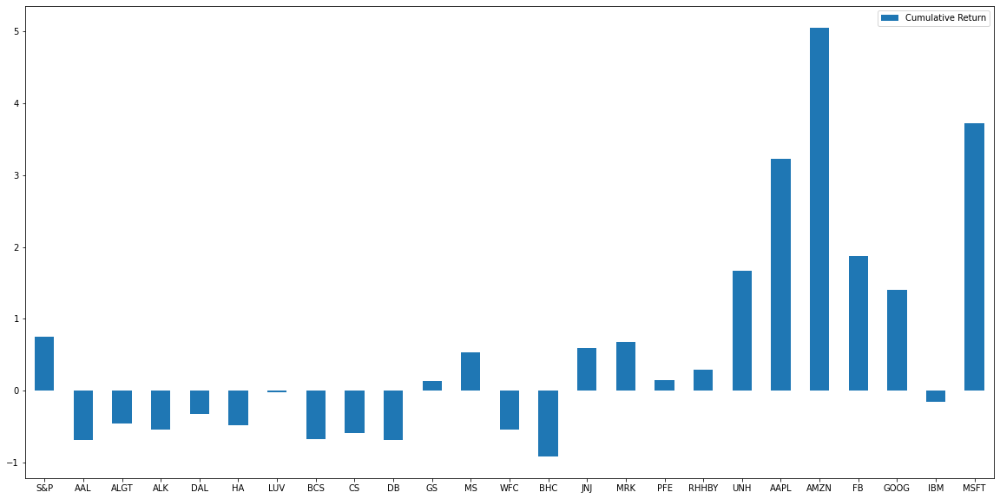

In [30]:
cum_return = (NP.iloc[-1] - NP.iloc[0]) / NP.iloc[0]
dfcumreturn = cum_return.to_frame()
dfcumreturn.columns=["Cumulative Return"]
CRchart = dfcumreturn.plot.bar(y='Cumulative Return', rot=0,figsize=(20,10))

In [163]:
dfcumreturn.to_excel(r'G:\Data Science - Upgrad\CumulativeReturn.xlsx', index = False)

Cumulative returns, We are going to pick only the positive cumulative return values for our portfolio.

In [31]:
Percent_cum_return = cum_return.round(decimals=3).astype(float).map("{:.2%}".format)
Percent_cum_return

S&P       74.80%
AAL      -68.60%
ALGT     -45.00%
ALK      -54.30%
DAL      -32.70%
HA       -47.90%
LUV       -2.40%
BCS      -66.60%
CS       -58.60%
DB       -68.30%
GS        14.20%
MS        53.50%
WFC      -54.30%
BHC      -91.30%
JNJ       59.80%
MRK       68.00%
PFE       15.30%
RHHBY     28.90%
UNH      167.40%
AAPL     322.70%
AMZN     504.70%
FB       188.00%
GOOG     140.40%
IBM      -15.30%
MSFT     371.50%
dtype: object

## Sharpe Ratio of all stocks

In [32]:
SR = pd.read_excel('Sharpe_ratio.xlsx')
Sharpe_Ratio = SR[['Ticker','Sharpe_ratio']]
rounded_SR = Sharpe_Ratio.round(decimals=2)
Fsharpe = rounded_SR['Sharpe_ratio'].abs()
dfsharpe = Fsharpe.to_frame()
rounded_SR['Sharpe_ratio'] = dfsharpe['Sharpe_ratio'].values
rounded_SR['Sharpe_ratio'] = dfsharpe['Sharpe_ratio'].to_numpy()


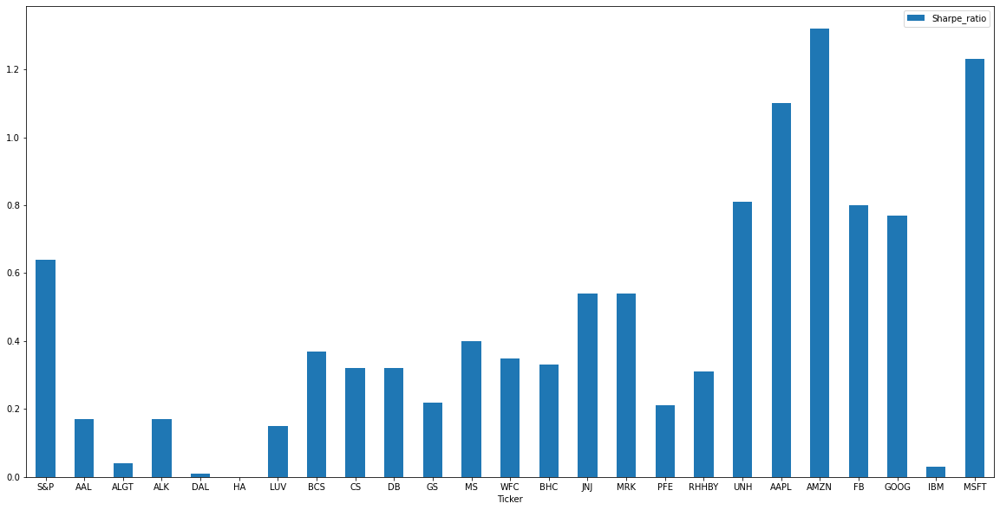

In [33]:
Sharpechart = rounded_SR.plot.bar(x='Ticker', y='Sharpe_ratio', rot=0,figsize=(20,10))

### Industry Based Stock EDA

In [34]:
airline = df[['AAL','ALGT','ALK','DAL','HA','LUV']].copy()
finance = df[['BCS','CS','DB','GS','MS','WFC']].copy()
pharma = df[['BHC','JNJ','MRK','PFE','RHHBY','UNH']].copy()
tech = df[['AAPL','AMZN','FB','GOOG','IBM','MSFT']].copy()

#### Airline - Technical Analyis - Charts

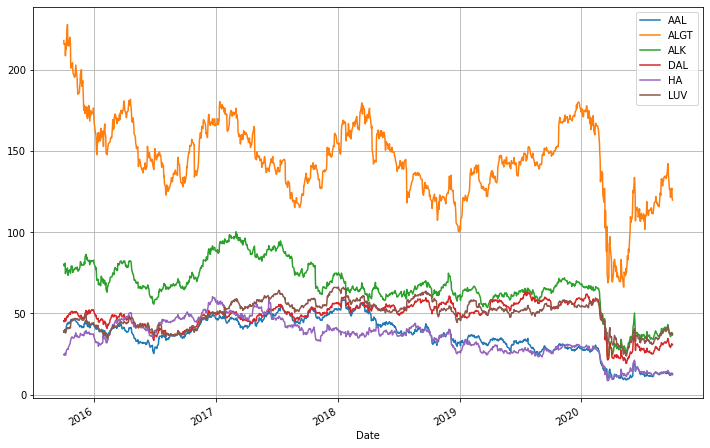

In [35]:
airline.plot(figsize=(12,8), grid=True)

In [36]:
NP_airline = airline.div(airline.iloc[0])
NP_airline.head()

,AAL,ALGT,ALK,DAL,HA,LUV
Date,,,,,,
2015-10-01,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
2015-10-02,0.985459,0.989036,0.987910,0.988108,0.981803,0.999219
2015-10-05,1.025255,0.991192,1.008476,1.034133,1.031136,1.023171
2015-10-06,0.972704,0.956969,0.928954,0.992953,0.980590,0.989326
2015-10-07,1.002806,0.981007,0.946903,1.012773,0.993126,1.007810


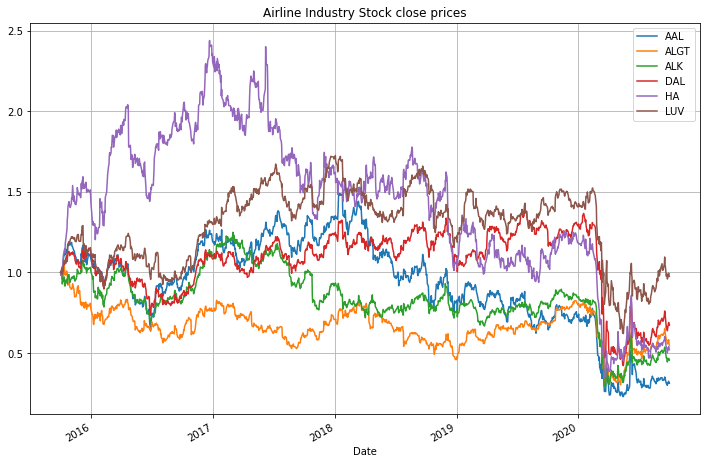

In [37]:
NP_airline.plot(figsize = (12,8), grid=True)
plt.legend(loc = 'best')
plt.title('Airline Industry Stock close prices')
plt.show(block=False)

All stocks from the airline stock close prices are below 1, It suggests that all stocks doesnt perform well for past 5 years.

In [38]:
RS_airline = airline.iloc[:, :25].div(df['S&P'], axis=0)
RS_airline.head()

,AAL,ALGT,ALK,DAL,HA,LUV
Date,,,,,,
2015-10-01,0.020376,0.113306,0.041703,0.023604,0.012855,0.019965
2015-10-02,0.019796,0.110482,0.040618,0.022994,0.012443,0.019668
2015-10-05,0.020226,0.108734,0.040719,0.023633,0.012833,0.019778
2015-10-06,0.019258,0.105358,0.037643,0.022774,0.012248,0.019193
2015-10-07,0.019696,0.107143,0.038064,0.023043,0.012306,0.019395


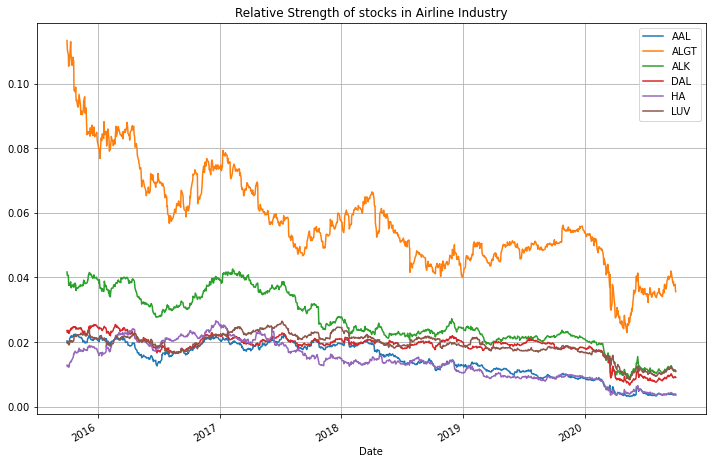

In [39]:
RS_airline.plot(figsize = (12,8), grid=True)
plt.legend(loc = 'best')
plt.title('Relative Strength of stocks in Airline Industry')
plt.show(block=False)

###### Daily Returns for airline industry stocks

In [40]:
return_stocks_airline = airline.pct_change()
return_stocks_airline.head(5)

,AAL,ALGT,ALK,DAL,HA,LUV
Date,,,,,,
2015-10-01,NaN,NaN,NaN,NaN,NaN,NaN
2015-10-02,-0.014541,-0.010964,-0.012090,-0.011892,-0.018197,-0.000781
2015-10-05,0.040383,0.002180,0.020818,0.046579,0.050247,0.023971
2015-10-06,-0.051257,-0.034527,-0.078853,-0.039821,-0.049020,-0.033079
2015-10-07,0.030947,0.025120,0.019321,0.019960,0.012784,0.018684


In [41]:
return_stocks_airline.describe()

,AAL,ALGT,ALK,DAL,HA,LUV
count,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000
mean,-0.000336,-0.000047,-0.000256,0.000042,0.000034,0.000245
std,0.034725,0.029101,0.026907,0.026478,0.033132,0.022913
min,-0.252246,-0.283300,-0.232385,-0.259924,-0.264971,-0.151094
25%,-0.013623,-0.011305,-0.010721,-0.009714,-0.014908,-0.009222
50%,-0.000480,-0.000363,0.000205,0.000783,0.000342,0.000617
75%,0.013233,0.011630,0.010619,0.009781,0.015078,0.009990
max,0.410970,0.292428,0.203079,0.210171,0.245837,0.144441


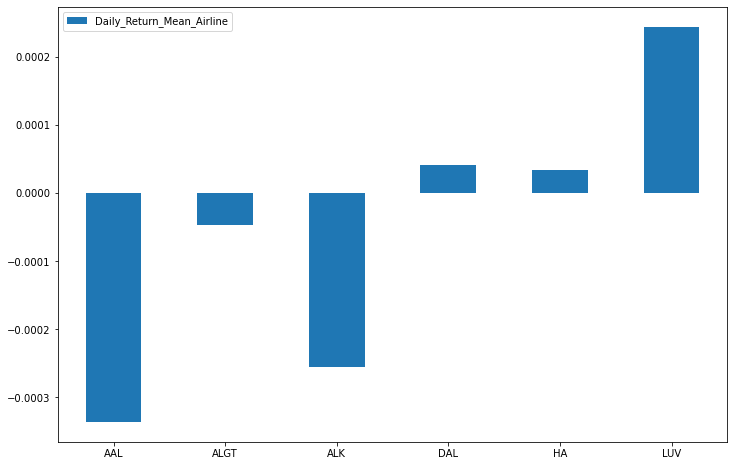

In [42]:
daily_returns_airlinemean = return_stocks_airline.mean()
Percent_airlinedailyreturn_mean = daily_returns_airlinemean.round(decimals=5).astype(float).map("{:.2%}".format)
dfDRmean_airline = daily_returns_airlinemean.to_frame()
dfDRmean_airline.columns=["Daily_Return_Mean_Airline"]
dfDRachart = dfDRmean_airline.plot.bar(y='Daily_Return_Mean_Airline', rot=0,figsize=(12,8))

In [43]:
Percent_airlinedailyreturn_mean

AAL     -0.03%
ALGT    -0.01%
ALK     -0.03%
DAL      0.00%
HA       0.00%
LUV      0.02%
dtype: object

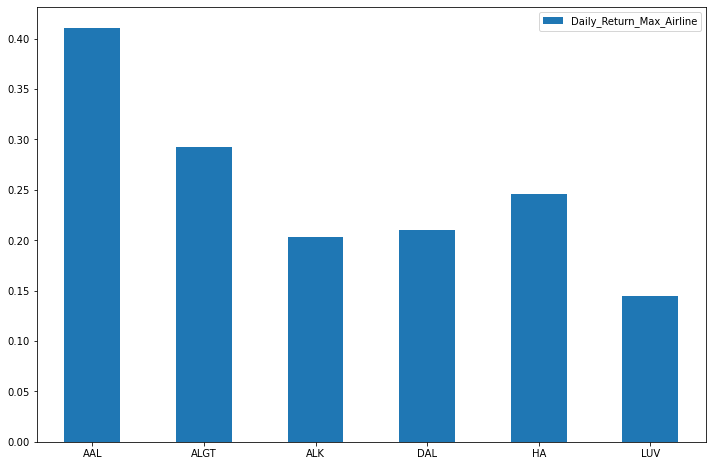

In [44]:
daily_returns_airlinemax = return_stocks_airline.max()
Percent_airlinedailyreturn_max = daily_returns_airlinemax.round(decimals=5).astype(float).map("{:.2%}".format)
dfDRmax_airline = daily_returns_airlinemax.to_frame()
dfDRmax_airline.columns=["Daily_Return_Max_Airline"]
dfDRmaxachart = dfDRmax_airline.plot.bar(y='Daily_Return_Max_Airline', rot=0,figsize=(12,8))

In [45]:
Percent_airlinedailyreturn_max

AAL     41.10%
ALGT    29.24%
ALK     20.31%
DAL     21.02%
HA      24.58%
LUV     14.44%
dtype: object

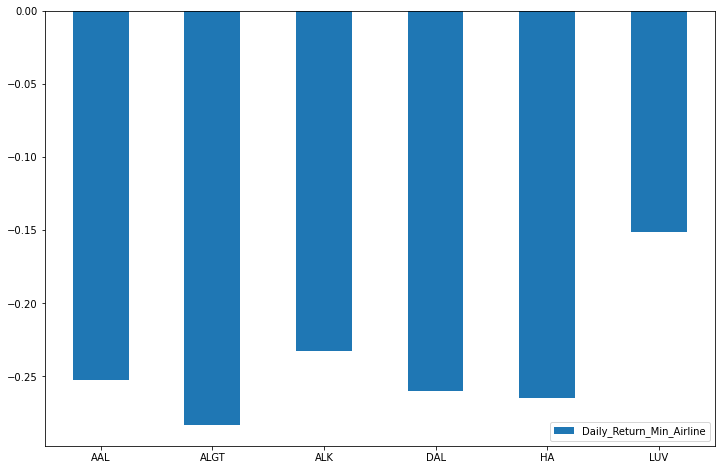

In [46]:
daily_returns_airlinemin = return_stocks_airline.min()
Percent_airlinedailyreturn_min = daily_returns_airlinemin.round(decimals=5).astype(float).map("{:.2%}".format)
dfDRmin_airline = daily_returns_airlinemin.to_frame()
dfDRmin_airline.columns=["Daily_Return_Min_Airline"]
dfDRminachart = dfDRmin_airline.plot.bar(y='Daily_Return_Min_Airline', rot=0,figsize=(12,8))

In [47]:
Percent_airlinedailyreturn_min

AAL     -25.22%
ALGT    -28.33%
ALK     -23.24%
DAL     -25.99%
HA      -26.50%
LUV     -15.11%
dtype: object

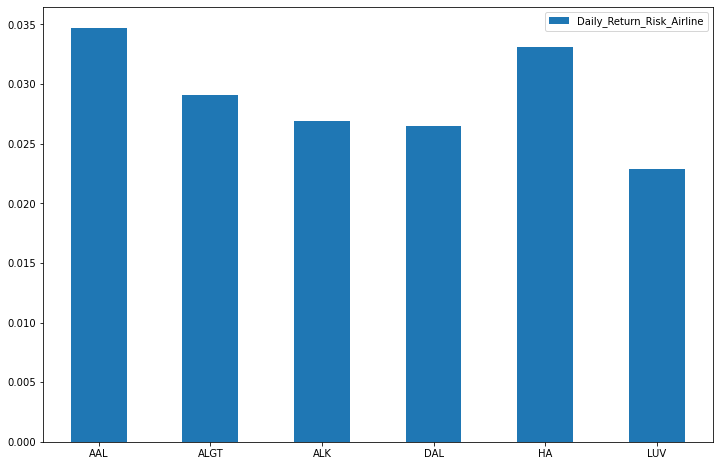

In [48]:
daily_returns_airline_risk = return_stocks_airline.std()
Percent_airlinedailyreturn_risk = daily_returns_airline_risk.round(decimals=5).astype(float).map("{:.2%}".format)
dfDRrisk_airline = daily_returns_airline_risk.to_frame()
dfDRrisk_airline.columns=["Daily_Return_Risk_Airline"]
dfDRriskachart = dfDRrisk_airline.plot.bar(y='Daily_Return_Risk_Airline', rot=0,figsize=(12,8))

Comparatively, The airline industry stocks risk is so high. Maybe its not advisable for Mr. Peter Jyengar.

In [49]:
Percent_airlinedailyreturn_risk

AAL     3.47%
ALGT    2.91%
ALK     2.69%
DAL     2.65%
HA      3.31%
LUV     2.29%
dtype: object

#### Finance - Technical Analyis - Charts

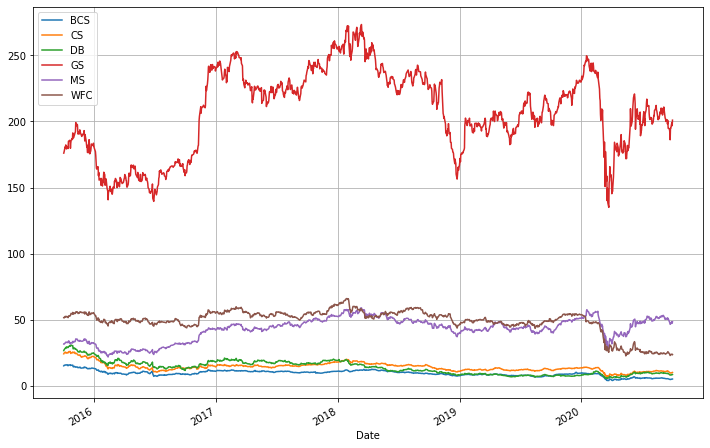

In [50]:
finance.plot(figsize=(12,8), grid=True)

In [51]:
NP_finance = finance.div(finance.iloc[0])
NP_finance.head()

,BCS,CS,DB,GS,MS,WFC
Date,,,,,,
2015-10-01,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
2015-10-02,1.025316,1.022831,1.023379,1.005624,0.997778,0.996501
2015-10-05,1.039307,1.044417,1.063348,1.026588,1.025079,1.018857
2015-10-06,1.035976,1.053549,1.070890,1.024429,1.027302,1.011470
2015-10-07,1.047968,1.051059,1.085596,1.035280,1.045397,1.014580


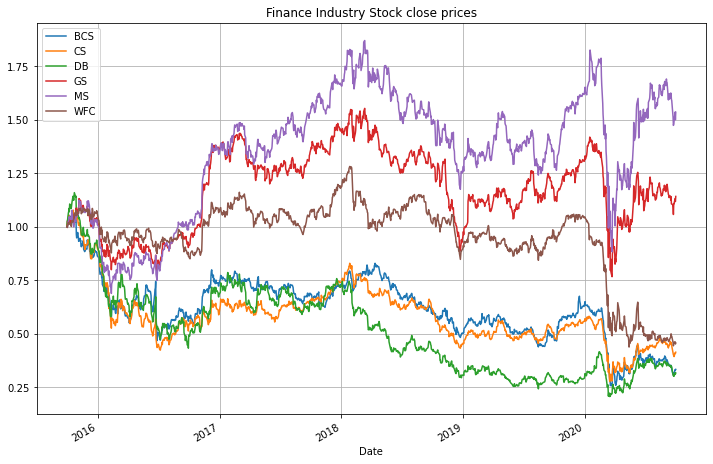

In [52]:
NP_finance.plot(figsize = (12,8), grid=True)
plt.legend(loc = 'best')
plt.title('Finance Industry Stock close prices')
plt.show(block=False)

GS and MS are considerable stock from finance industry.

In [53]:
RS_finance = finance.iloc[:, :25].div(df['S&P'], axis=0)
RS_finance.head()

,BCS,CS,DB,GS,MS,WFC
Date,,,,,,
2015-10-01,0.007802,0.012522,0.013785,0.091495,0.016374,0.026738
2015-10-02,0.007887,0.012627,0.013908,0.090711,0.016107,0.026269
2015-10-05,0.007851,0.012662,0.014192,0.090939,0.016250,0.026376
2015-10-06,0.007854,0.012819,0.014344,0.091074,0.016344,0.026279
2015-10-07,0.007881,0.012686,0.014425,0.091305,0.016499,0.026150


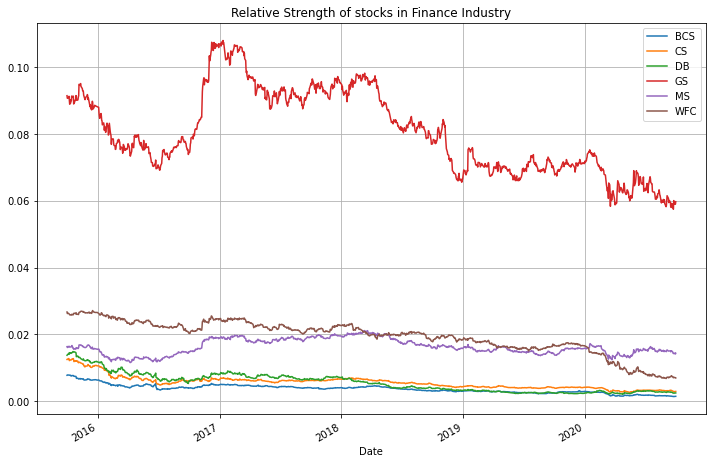

In [54]:
RS_finance.plot(figsize = (12,8), grid=True)
plt.legend(loc = 'best')
plt.title('Relative Strength of stocks in Finance Industry')
plt.show(block=False)

In [55]:
return_stocks_finance = finance.pct_change()
return_stocks_finance.head(5)

,BCS,CS,DB,GS,MS,WFC
Date,,,,,,
2015-10-01,NaN,NaN,NaN,NaN,NaN,NaN
2015-10-02,0.025316,0.022831,0.023379,0.005624,-0.002222,-0.003499
2015-10-05,0.013645,0.021104,0.039057,0.020846,0.027362,0.022435
2015-10-06,-0.003205,0.008744,0.007092,-0.002103,0.002168,-0.007251
2015-10-07,0.011576,-0.002364,0.013732,0.010592,0.017614,0.003075


In [56]:
return_stocks_finance.describe()

,BCS,CS,DB,GS,MS,WFC
count,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000
mean,-0.000548,-0.000437,-0.000529,0.000303,0.000578,-0.000414
std,0.025119,0.022842,0.027743,0.019899,0.021810,0.020349
min,-0.218519,-0.182598,-0.174888,-0.127053,-0.156000,-0.158676
25%,-0.010787,-0.010442,-0.014976,-0.008386,-0.009023,-0.007917
50%,0.000000,0.000000,-0.001051,0.000299,0.000445,-0.000362
75%,0.010215,0.010416,0.013872,0.009705,0.010450,0.007589
max,0.151042,0.163447,0.140244,0.175803,0.197700,0.145347


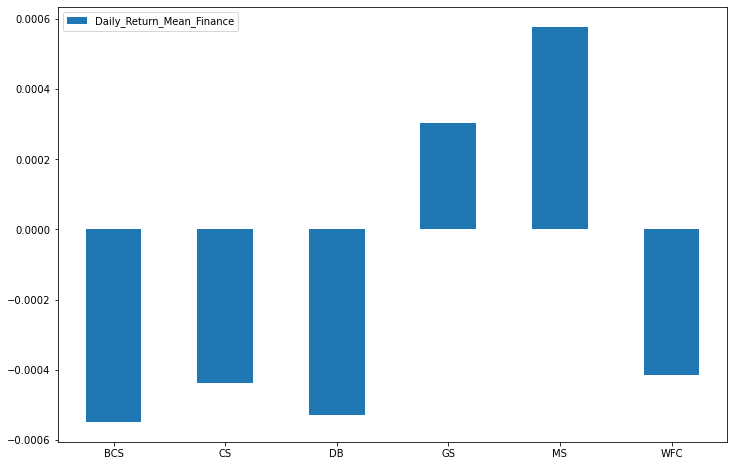

In [57]:
daily_returns_financemean = return_stocks_finance.mean()
Percent_financedailyreturn_mean = daily_returns_financemean.round(decimals=5).astype(float).map("{:.2%}".format)
dfDRmean_finance = daily_returns_financemean.to_frame()
dfDRmean_finance.columns=["Daily_Return_Mean_Finance"]
dfDRmeanfchart = dfDRmean_finance.plot.bar(y='Daily_Return_Mean_Finance', rot=0,figsize=(12,8))

In [58]:
Percent_financedailyreturn_mean

BCS    -0.06%
CS     -0.04%
DB     -0.05%
GS      0.03%
MS      0.06%
WFC    -0.04%
dtype: object

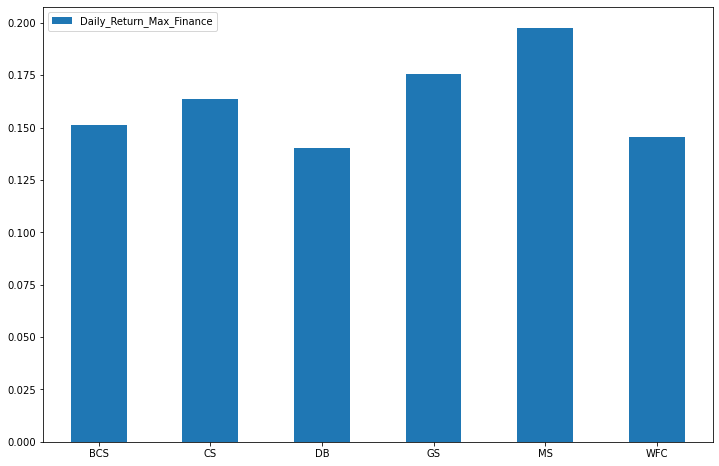

In [59]:
daily_returns_financemax = return_stocks_finance.max()
Percent_financedailyreturn_max = daily_returns_financemax.round(decimals=5).astype(float).map("{:.2%}".format)
dfDRmax_finance = daily_returns_financemax.to_frame()
dfDRmax_finance.columns=["Daily_Return_Max_Finance"]
dfDRmaxfchart = dfDRmax_finance.plot.bar(y='Daily_Return_Max_Finance', rot=0,figsize=(12,8))

In [60]:
Percent_financedailyreturn_max

BCS    15.10%
CS     16.35%
DB     14.02%
GS     17.58%
MS     19.77%
WFC    14.54%
dtype: object

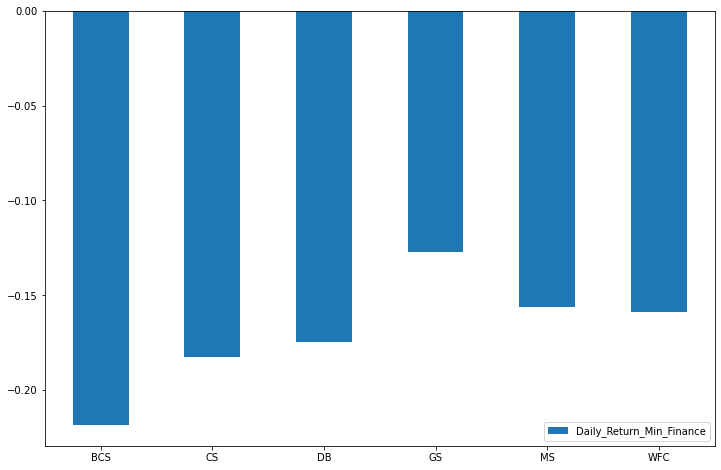

In [61]:
daily_returns_financemin = return_stocks_finance.min()
Percent_financedailyreturn_min = daily_returns_financemin.round(decimals=5).astype(float).map("{:.2%}".format)
dfDRmin_finance = daily_returns_financemin.to_frame()
dfDRmin_finance.columns=["Daily_Return_Min_Finance"]
dfDRminfchart = dfDRmin_finance.plot.bar(y='Daily_Return_Min_Finance', rot=0,figsize=(12,8))

In [62]:
Percent_financedailyreturn_min

BCS    -21.85%
CS     -18.26%
DB     -17.49%
GS     -12.71%
MS     -15.60%
WFC    -15.87%
dtype: object

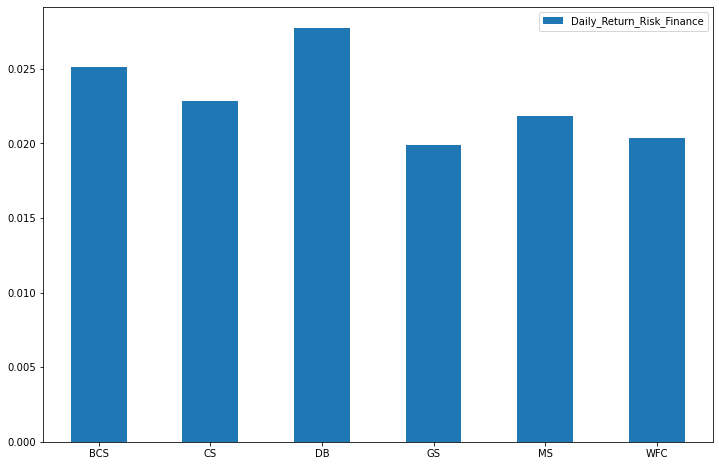

In [63]:
daily_returns_finance_risk = return_stocks_finance.std()
Percent_financedailyreturn_risk = daily_returns_finance_risk.round(decimals=5).astype(float).map("{:.2%}".format)
dfDRrisk_finance = daily_returns_finance_risk.to_frame()
dfDRrisk_finance.columns=["Daily_Return_Risk_Finance"]
dfDRriskfchart = dfDRrisk_finance.plot.bar(y='Daily_Return_Risk_Finance', rot=0,figsize=(12,8))

In [64]:
Percent_financedailyreturn_risk

BCS    2.51%
CS     2.28%
DB     2.77%
GS     1.99%
MS     2.18%
WFC    2.04%
dtype: object

#### Pharma - Technical Analyis - Charts

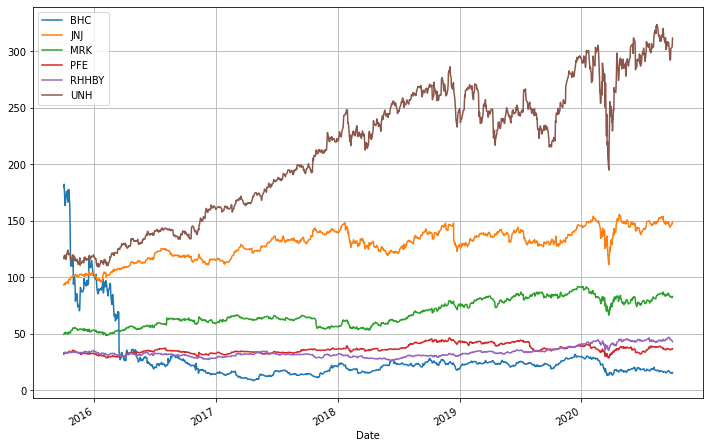

In [65]:
pharma.plot(figsize=(12,8), grid=True)

In [66]:
NP_pharma = pharma.div(pharma.iloc[0])
NP_pharma.head()

,BHC,JNJ,MRK,PFE,RHHBY,UNH
Date,,,,,,
2015-10-01,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
2015-10-02,1.015145,1.008157,1.015597,1.038945,1.003010,1.019038
2015-10-05,0.910134,1.017066,1.037675,1.051508,1.006623,1.026070
2015-10-06,0.924276,1.002683,1.008710,1.029837,1.009332,0.995198
2015-10-07,0.945601,1.019427,1.032003,1.045540,0.979831,0.998456


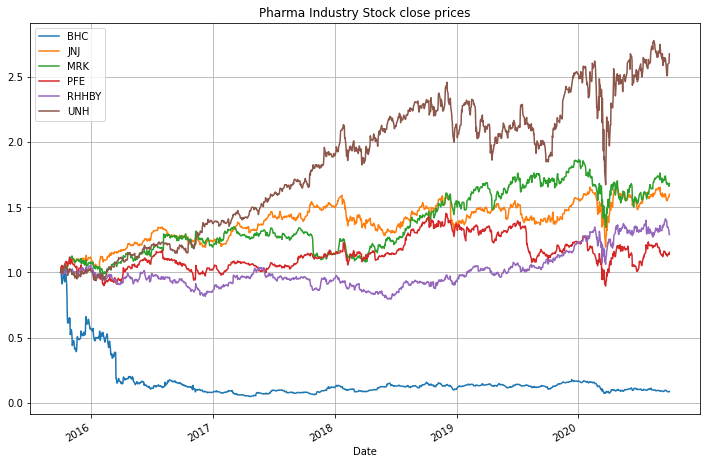

In [67]:
NP_pharma.plot(figsize = (12,8), grid=True)
plt.legend(loc = 'best')
plt.title('Pharma Industry Stock close prices')
plt.show(block=False)

There is a conclusive evidence that we can exclude the BHC stock. apart from that other stocks are considerable.

In [68]:
RS_pharma = pharma.iloc[:, :25].div(df['S&P'], axis=0)
RS_pharma.head()

,BHC,JNJ,MRK,PFE,RHHBY,UNH
Date,,,,,,
2015-10-01,0.093356,0.048430,0.025662,0.016550,0.017268,0.060614
2015-10-02,0.093432,0.048136,0.025695,0.016952,0.017075,0.060896
2015-10-05,0.082263,0.047689,0.025782,0.016849,0.016829,0.060215
2015-10-06,0.083842,0.047184,0.025153,0.016561,0.016935,0.058613
2015-10-07,0.085092,0.047589,0.025528,0.016680,0.016309,0.058337


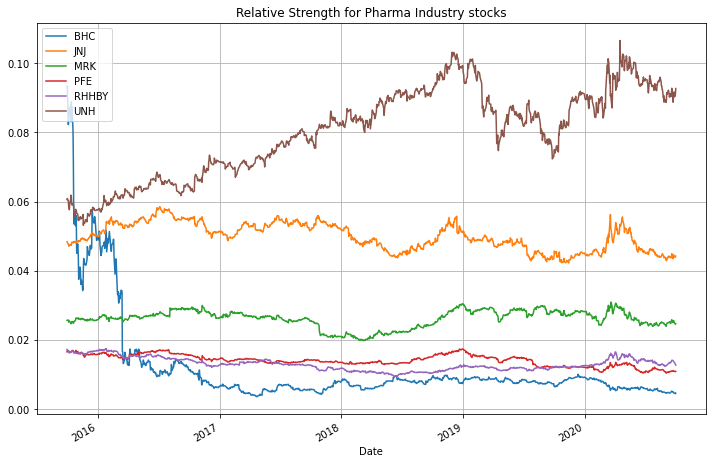

In [69]:
RS_pharma.plot(figsize = (12,8), grid=True)
plt.legend(loc = 'best')
plt.title('Relative Strength for Pharma Industry stocks')
plt.show(block=False)

In [70]:
return_stocks_pharma = pharma.pct_change()
return_stocks_pharma.head(5)

,BHC,JNJ,MRK,PFE,RHHBY,UNH
Date,,,,,,
2015-10-01,NaN,NaN,NaN,NaN,NaN,NaN
2015-10-02,0.015145,0.008157,0.015597,0.038945,0.003010,0.019038
2015-10-05,-0.103444,0.008836,0.021739,0.012092,0.003601,0.006901
2015-10-06,0.015539,-0.014141,-0.027913,-0.020609,0.002691,-0.030088
2015-10-07,0.023072,0.016699,0.023092,0.015249,-0.029228,0.003274


In [71]:
return_stocks_pharma.describe()

,BHC,JNJ,MRK,PFE,RHHBY,UNH
count,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000
mean,-0.000897,0.000451,0.000511,0.000209,0.000293,0.000941
std,0.044551,0.012459,0.014067,0.013826,0.013514,0.017810
min,-0.514629,-0.100379,-0.088990,-0.077346,-0.089609,-0.172769
25%,-0.019678,-0.004277,-0.006240,-0.005856,-0.006237,-0.006644
50%,-0.000501,0.000493,0.000245,0.000115,0.000229,0.000809
75%,0.018022,0.005921,0.007616,0.006372,0.006919,0.008161
max,0.337444,0.079977,0.104080,0.089607,0.130118,0.127989


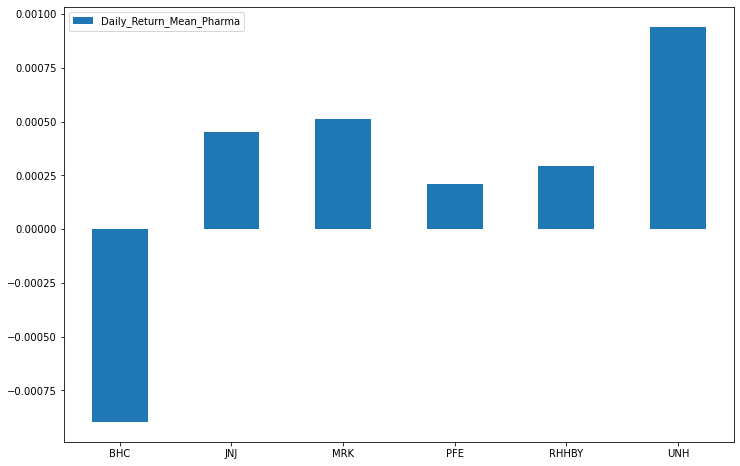

In [72]:
daily_returns_pharmamean = return_stocks_pharma.mean()
Percent_pharmadailyreturn_mean = daily_returns_pharmamean.round(decimals=5).astype(float).map("{:.2%}".format)
dfDRmean_pharma = daily_returns_pharmamean.to_frame()
dfDRmean_pharma.columns=["Daily_Return_Mean_Pharma"]
dfDRmeanpchart = dfDRmean_pharma.plot.bar(y='Daily_Return_Mean_Pharma', rot=0,figsize=(12,8))

In [73]:
Percent_pharmadailyreturn_mean

BHC      -0.09%
JNJ       0.04%
MRK       0.05%
PFE       0.02%
RHHBY     0.03%
UNH       0.09%
dtype: object

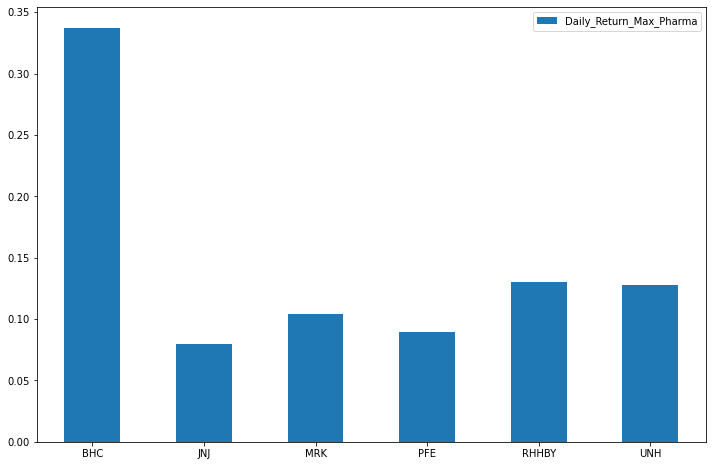

In [74]:
daily_returns_pharmamax = return_stocks_pharma.max()
Percent_pharmadailyreturn_max = daily_returns_pharmamax.round(decimals=5).astype(float).map("{:.2%}".format)
dfDRmax_pharma = daily_returns_pharmamax.to_frame()
dfDRmax_pharma.columns=["Daily_Return_Max_Pharma"]
dfDRmaxpchart = dfDRmax_pharma.plot.bar(y='Daily_Return_Max_Pharma', rot=0,figsize=(12,8))

In [75]:
Percent_pharmadailyreturn_max

BHC      33.74%
JNJ       8.00%
MRK      10.41%
PFE       8.96%
RHHBY    13.01%
UNH      12.80%
dtype: object

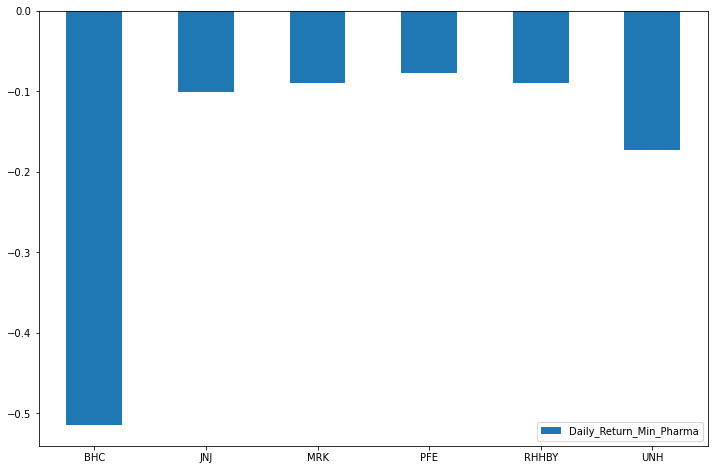

In [76]:
daily_returns_pharmamin = return_stocks_pharma.min()
Percent_pharmadailyreturn_min = daily_returns_pharmamin.round(decimals=5).astype(float).map("{:.2%}".format)
dfDRmin_pharma = daily_returns_pharmamin.to_frame()
dfDRmin_pharma.columns=["Daily_Return_Min_Pharma"]
dfDRminpchart = dfDRmin_pharma.plot.bar(y='Daily_Return_Min_Pharma', rot=0,figsize=(12,8))

In [77]:
Percent_pharmadailyreturn_min

BHC      -51.46%
JNJ      -10.04%
MRK       -8.90%
PFE       -7.74%
RHHBY     -8.96%
UNH      -17.28%
dtype: object

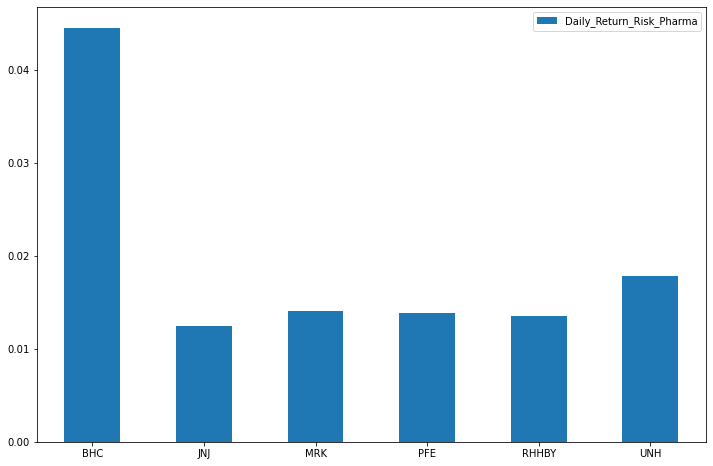

In [78]:
daily_returns_pharma_risk = return_stocks_pharma.std()
Percent_pharmadailyreturn_risk = daily_returns_pharma_risk.round(decimals=5).astype(float).map("{:.2%}".format)
dfDRrisk_pharma = daily_returns_pharma_risk.to_frame()
dfDRrisk_pharma.columns=["Daily_Return_Risk_Pharma"]
dfDRriskpchart = dfDRrisk_pharma.plot.bar(y='Daily_Return_Risk_Pharma', rot=0,figsize=(12,8))

In [79]:
Percent_pharmadailyreturn_risk

BHC      4.46%
JNJ      1.25%
MRK      1.41%
PFE      1.38%
RHHBY    1.35%
UNH      1.78%
dtype: object

Yeah, BHC risk So high.

#### Technology based Stocks - Technical Analyis - Charts

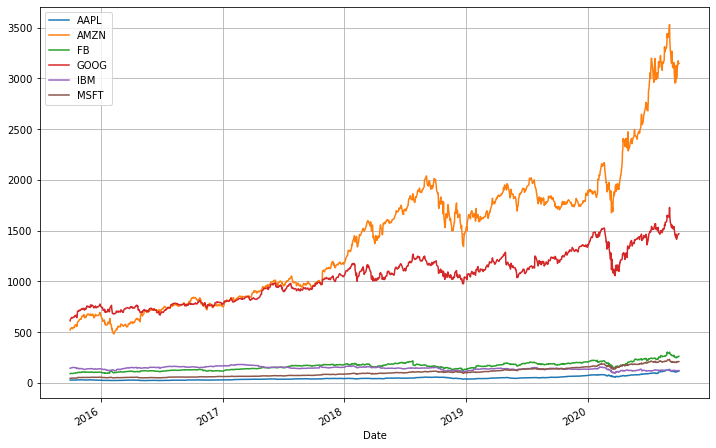

In [80]:
tech.plot(figsize=(12,8), grid=True)

In [81]:
NP_tech = tech.div(tech.iloc[0])
NP_tech.head()

,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,
2015-10-01,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
2015-10-02,1.006934,1.022699,1.012314,1.025553,1.006895,1.021520
2015-10-05,1.010949,1.044093,1.033645,1.049371,1.037955,1.045281
2015-10-06,1.015693,1.032186,1.020341,1.055865,1.036145,1.047971
2015-10-07,1.010949,1.040751,1.015943,1.050827,1.045268,1.049092


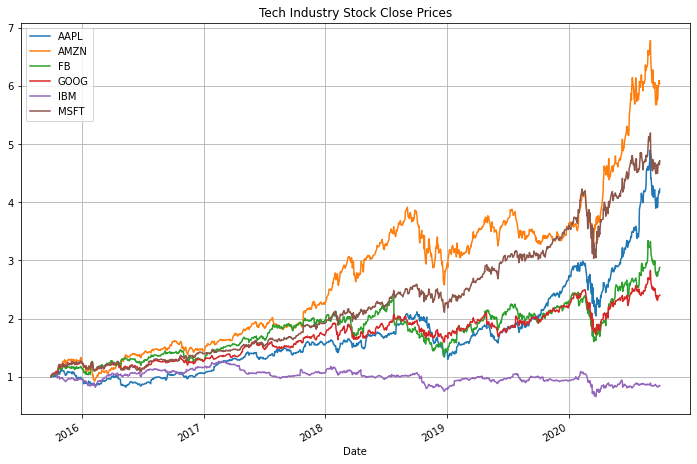

In [82]:
NP_tech.plot(figsize = (12,8), grid=True)
plt.legend(loc = 'best')
plt.title('Tech Industry Stock Close Prices')
plt.show(block=False)

Except IBM, All other tech stocks are hot cakes. Most of the stocks are worthy enough to be in the portfolio.

In [83]:
RS_tech = tech.iloc[:, :25].div(df['S&P'], axis=0)
RS_tech.head()

,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,
2015-10-01,0.014242,0.270670,0.047276,0.317748,0.074638,0.023188
2015-10-02,0.014139,0.272907,0.047182,0.321268,0.074092,0.023353
2015-10-05,0.013940,0.273612,0.047311,0.322825,0.075006,0.023467
2015-10-06,0.014056,0.271466,0.046871,0.325993,0.075144,0.023612
2015-10-07,0.013879,0.271536,0.046297,0.321851,0.075202,0.023449


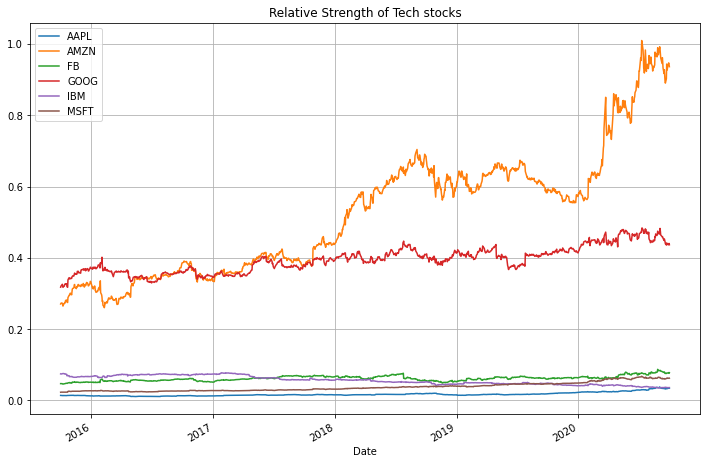

In [84]:
RS_tech.plot(figsize = (12,8), grid=True)
plt.legend(loc = 'best')
plt.title('Relative Strength of Tech stocks')
plt.show(block=False)

In [85]:
return_stocks_tech = tech.pct_change()
return_stocks_tech.head(5)

,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,
2015-10-01,NaN,NaN,NaN,NaN,NaN,NaN
2015-10-02,0.006934,0.022699,0.012314,0.025553,0.006895,0.021520
2015-10-05,0.003987,0.020919,0.021071,0.023225,0.030848,0.023261
2015-10-06,0.004693,-0.011404,-0.012871,0.006189,-0.001744,0.002573
2015-10-07,-0.004671,0.008298,-0.004310,-0.004772,0.008805,0.001070


In [86]:
return_stocks_tech.describe()

,AAPL,AMZN,FB,GOOG,IBM,MSFT
count,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000
mean,0.001322,0.001611,0.001050,0.000834,-0.000002,0.001387
std,0.018730,0.018969,0.020354,0.016520,0.016086,0.017539
min,-0.128652,-0.079221,-0.189609,-0.111008,-0.128507,-0.147390
25%,-0.006240,-0.006716,-0.007223,-0.005788,-0.006498,-0.005893
50%,0.000997,0.001636,0.001193,0.000973,0.000483,0.001225
75%,0.009879,0.010765,0.010880,0.008785,0.006878,0.009161
max,0.119723,0.132164,0.155214,0.104485,0.113010,0.142169


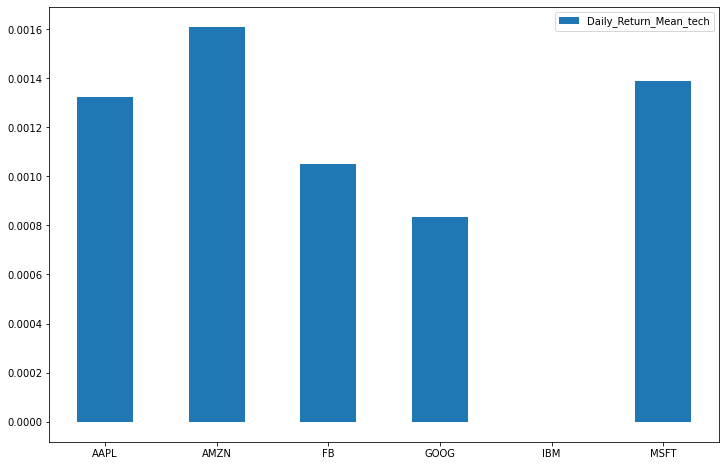

In [87]:
daily_returns_techmean = return_stocks_tech.mean()
Percent_techdailyreturn_mean = daily_returns_techmean.round(decimals=5).astype(float).map("{:.2%}".format)
dfDRmean_tech = daily_returns_techmean.to_frame()
dfDRmean_tech.columns=["Daily_Return_Mean_tech"]
dfDRmeantchart = dfDRmean_tech.plot.bar(y='Daily_Return_Mean_tech', rot=0,figsize=(12,8))

In [88]:
Percent_techdailyreturn_mean

AAPL     0.13%
AMZN     0.16%
FB       0.10%
GOOG     0.08%
IBM     -0.00%
MSFT     0.14%
dtype: object

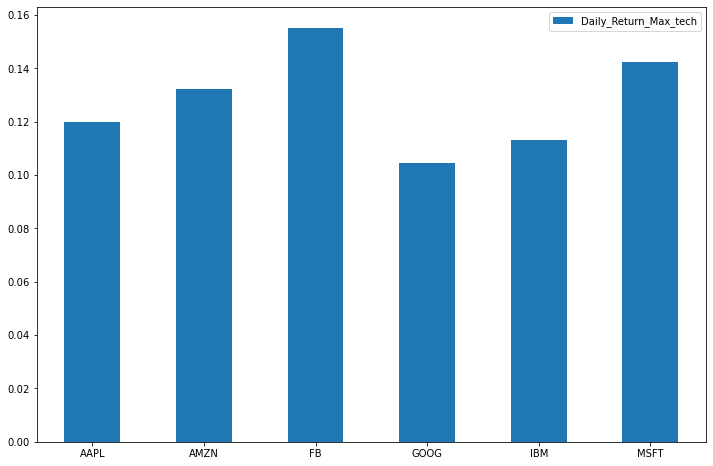

In [89]:
daily_returns_techmax = return_stocks_tech.max()
Percent_techdailyreturn_max = daily_returns_techmax.round(decimals=5).astype(float).map("{:.2%}".format)
dfDRmax_tech = daily_returns_techmax.to_frame()
dfDRmax_tech.columns=["Daily_Return_Max_tech"]
dfDRmaxtchart = dfDRmax_tech.plot.bar(y='Daily_Return_Max_tech', rot=0,figsize=(12,8))

In [90]:
Percent_techdailyreturn_max

AAPL    11.97%
AMZN    13.22%
FB      15.52%
GOOG    10.45%
IBM     11.30%
MSFT    14.22%
dtype: object

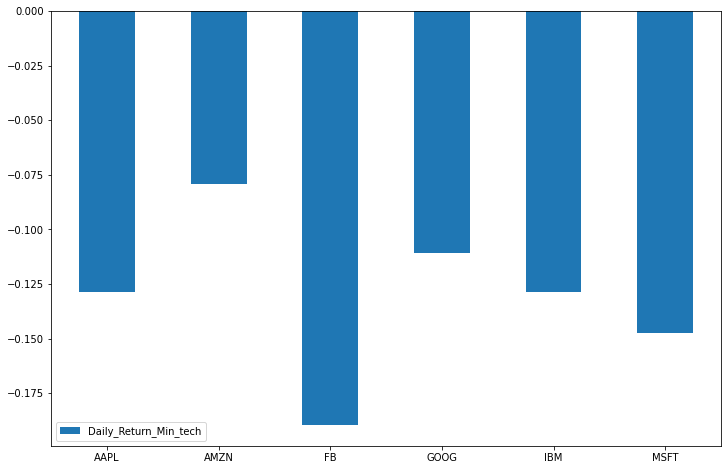

In [91]:
daily_returns_techmin = return_stocks_tech.min()
Percent_techdailyreturn_min = daily_returns_techmin.round(decimals=5).astype(float).map("{:.2%}".format)
dfDRmin_tech = daily_returns_techmin.to_frame()
dfDRmin_tech.columns=["Daily_Return_Min_tech"]
dfDRmintchart = dfDRmin_tech.plot.bar(y='Daily_Return_Min_tech', rot=0,figsize=(12,8))

In [92]:
Percent_techdailyreturn_min

AAPL    -12.86%
AMZN     -7.92%
FB      -18.96%
GOOG    -11.10%
IBM     -12.85%
MSFT    -14.74%
dtype: object

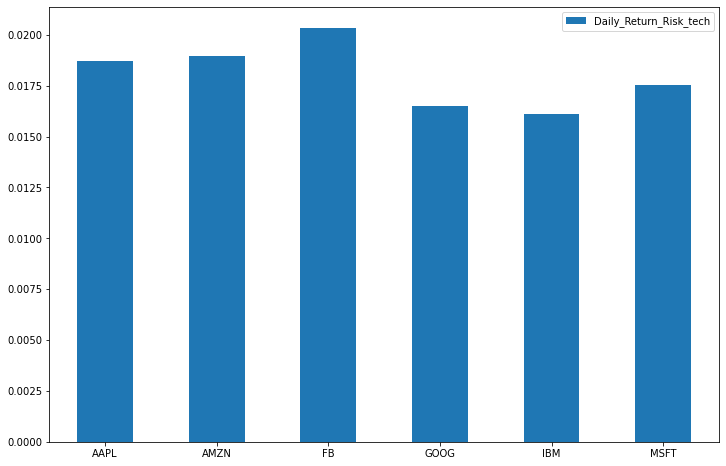

In [93]:
daily_returns_tech_risk = return_stocks_tech.std()
Percent_techdailyreturn_risk = daily_returns_tech_risk.round(decimals=5).astype(float).map("{:.2%}".format)
dfDRrisk_tech = daily_returns_tech_risk.to_frame()
dfDRrisk_tech.columns=["Daily_Return_Risk_tech"]
dfDRrisktchart = dfDRrisk_tech.plot.bar(y='Daily_Return_Risk_tech', rot=0,figsize=(12,8))

Hmmm, Risk is considerably low compared to the airline & finance industry

In [94]:
Percent_techdailyreturn_risk

AAPL    1.87%
AMZN    1.90%
FB      2.04%
GOOG    1.65%
IBM     1.61%
MSFT    1.75%
dtype: object

# Investment Portfolio Observation

We gathered all essential information from above analysis, stored it in a dataframe.

In [95]:
Portfolio_Metrics = pd.read_excel("Portfolio Metrics.xlsx", index_col=0)
Portfolio_Metrics

,S&P,AAL,ALGT,ALK,DAL,HA,LUV,BCS,CS,DB,...,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Average_Daily_Returns,0.05%,-0.03%,-0.01%,-0.03%,0.00%,0.00%,0.02%,-0.06%,-0.04%,-0.05%,...,0.05%,0.02%,0.03%,0.09%,0.13%,0.16%,0.10%,0.08%,-0.00%,0.14%
Risk(Daily Return),1.20%,3.50%,2.90%,2.70%,2.60%,3.30%,2.30%,2.50%,2.30%,2.80%,...,1.40%,1.40%,1.40%,1.80%,1.90%,1.90%,2.00%,1.70%,1.60%,1.80%
Annualized_Returns,13.00%,-8.50%,-1.20%,-6.40%,1.10%,0.90%,6.20%,-13.80%,-11.00%,-13.30%,...,12.90%,5.30%,7.40%,23.70%,33.30%,40.60%,26.50%,21.00%,-0.00%,35.00%
Annualized_Risk,19.20%,55.10%,46.20%,42.70%,42.00%,52.60%,36.40%,39.90%,36.30%,44.00%,...,22.30%,21.90%,21.50%,28.30%,29.70%,30.10%,32.30%,26.20%,25.50%,27.80%
Cumulative_Returns,74.80%,-68.60%,-45.00%,-54.30%,-32.70%,-47.90%,-2.40%,-66.60%,-58.60%,-68.30%,...,68.00%,15.30%,28.90%,167.40%,322.70%,504.70%,188.00%,140.40%,-15.30%,371.50%
Sharpe Ratio,0.64,-0.17,-0.04,-0.17,0.01,0,0.15,-0.37,-0.32,-0.32,...,0.54,0.21,0.31,0.81,1.1,1.32,0.8,0.77,-0.03,1.23


In [96]:
T_PM = Portfolio_Metrics.transpose()
T_PM = T_PM.replace('\%','',regex=True).astype(float)
T_PM

,Average_Daily_Returns,Risk(Daily Return),Annualized_Returns,Annualized_Risk,Cumulative_Returns,Sharpe Ratio
S&P,0.05,1.2,13.0,19.2,74.8,0.64
AAL,-0.03,3.5,-8.5,55.1,-68.6,-0.17
ALGT,-0.01,2.9,-1.2,46.2,-45.0,-0.04
ALK,-0.03,2.7,-6.4,42.7,-54.3,-0.17
DAL,0.00,2.6,1.1,42.0,-32.7,0.01
HA,0.00,3.3,0.9,52.6,-47.9,0.00
LUV,0.02,2.3,6.2,36.4,-2.4,0.15
BCS,-0.06,2.5,-13.8,39.9,-66.6,-0.37
CS,-0.04,2.3,-11.0,36.3,-58.6,-0.32
DB,-0.05,2.8,-13.3,44.0,-68.3,-0.32


In [97]:
T_PM.info()

<class 'pandas.core.frame.DataFrame'>
Index: 25 entries, S&P to MSFT
Data columns (total 6 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Average_Daily_Returns  25 non-null     float64
 1   Risk(Daily Return)     25 non-null     float64
 2   Annualized_Returns     25 non-null     float64
 3   Annualized_Risk        25 non-null     float64
 4   Cumulative_Returns     25 non-null     float64
 5   Sharpe Ratio           25 non-null     float64
dtypes: float64(6)
memory usage: 2.0+ KB


# Portfolio Suggestions for Patrick Jyengar

In [98]:
data_Patrick = [df["JNJ"],df["GOOG"]]
Preferred_Stocks_Patrick = pd.concat(data_Patrick, axis=1)
Preferred_Stocks_Patrick

,JNJ,GOOG
Date,,
2015-10-01,93.17,611.29
2015-10-02,93.93,626.91
2015-10-05,94.76,641.47
2015-10-06,93.42,645.44
2015-10-07,94.98,642.36
...,...,...
2020-09-24,144.67,1428.29
2020-09-25,145.66,1444.96
2020-09-28,147.11,1464.52


In [99]:
stocks_Patrick = ['JNJ','GOOG']
initial_weight_Patrick = np.array([0.5, 0.5])

### Daily return from each stock - Patrick Portfolio

In [100]:
return_stocks_Patrick = Preferred_Stocks_Patrick.pct_change()
return_stocks_Patrick.head(5)

,JNJ,GOOG
Date,,
2015-10-01,NaN,NaN
2015-10-02,0.008157,0.025553
2015-10-05,0.008836,0.023225
2015-10-06,-0.014141,0.006189
2015-10-07,0.016699,-0.004772


In [101]:
return_stocks_Patrick.describe()

,JNJ,GOOG
count,1258.000000,1258.000000
mean,0.000451,0.000834
std,0.012459,0.016520
min,-0.100379,-0.111008
25%,-0.004277,-0.005788
50%,0.000493,0.000973
75%,0.005921,0.008785
max,0.079977,0.104485


### Average daily returns of preferred stocks of Patrick

In [102]:
daily_returns_mean_Patrick = return_stocks_Patrick.mean()
daily_returns_mean_Patrick

JNJ     0.000451
GOOG    0.000834
dtype: float64

In [103]:
allocated_daily_returns_Patrick = (initial_weight_Patrick * daily_returns_mean_Patrick)
portfolio_return_Patrick = np.sum(allocated_daily_returns_Patrick)
print(portfolio_return_Patrick)

0.0006423032851352142


#### Daily Return from the Portfolio of Patrick

In [104]:
return_stocks_Patrick['Portfolio_Daily_Return_Patrick'] = return_stocks_Patrick.dot(initial_weight_Patrick)
return_stocks_Patrick.tail(5)

,JNJ,GOOG,Portfolio_Daily_Return_Patrick
Date,,,
2020-09-24,0.001592,0.009242,0.005417
2020-09-25,0.006843,0.011671,0.009257
2020-09-28,0.009955,0.013537,0.011746
2020-09-29,-0.000340,0.003284,0.001472
2020-09-30,0.012376,0.000184,0.006280


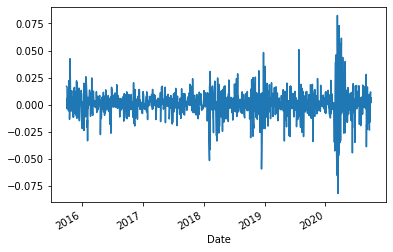

In [105]:
return_stocks_Patrick['Portfolio_Daily_Return_Patrick'].plot()

### Cumulative return from the Portfolio of Patrick

In [106]:
Cumulative_returns_daily_Patrick = (1+return_stocks_Patrick).cumprod()
Cumulative_returns_daily_Patrick.tail(5)

,JNJ,GOOG,Portfolio_Daily_Return_Patrick
Date,,,
2020-09-24,1.552753,2.336518,1.979318
2020-09-25,1.563379,2.363788,1.997641
2020-09-28,1.578942,2.395786,2.021104
2020-09-29,1.578405,2.403655,2.024080
2020-09-30,1.597939,2.404096,2.036791


In [107]:
cumreturnmeanPatrick = Cumulative_returns_daily_Patrick.mean()
cumreturnmeanPatrick

JNJ                               1.385420
GOOG                              1.703168
Portfolio_Daily_Return_Patrick    1.558238
dtype: float64

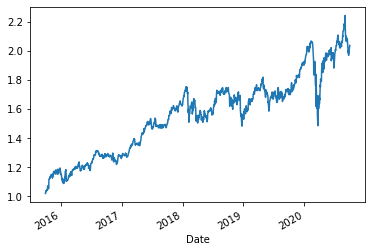

In [108]:
Cumulative_returns_daily_Patrick['Portfolio_Daily_Return_Patrick'].plot()

### Portfolio Risk – Portfolio Standard Deviation - Patrick Jyengar Portfolio

In [109]:
covariance_portfolio_Patrick = return_stocks_Patrick.iloc[:,:-1]
covariance_portfolio_Patrick = (covariance_portfolio_Patrick.cov())*252

covariance_portfolio_Patrick

,JNJ,GOOG
JNJ,0.039117,0.023301
GOOG,0.023301,0.068777


In [110]:
portfolio_variance_Patrick = np.dot(initial_weight_Patrick.T,np.dot(covariance_portfolio_Patrick, initial_weight_Patrick))

In [111]:
portfolio_risk_Patrick = np.sqrt(portfolio_variance_Patrick)
portfolio_risk_Patrick

0.19653034390694016

In [112]:
Sharpe_Ratio_Patrick = (return_stocks_Patrick['Portfolio_Daily_Return_Patrick'].mean()-0.0075)/ return_stocks_Patrick['Portfolio_Daily_Return_Patrick'].std()
Sharpe_Ratio_Patrick

-0.5539224034379598

In [113]:
Annualised_Sharpe_Ratio_Patrick = (252**0.5)*Sharpe_Ratio_Patrick
Annualised_Sharpe_Ratio_Patrick

-8.793245550744189

###### This is the best sharpe ratio we can come up with the given Mr.Patrick Jyengar's future goals. And this outcome suggests this is excellent portfolio to have for next 5 years.

#### Expected Returns from Patrick's Portfolio

**Formula**: 

((Weightage of stock allocation * cumulative return of stock1 + Weightage of stock allocation * cumulative return of stock2)+1) * Investment Captial 

Cumulative return of Johnson & Johnson = 59.8%
Cumulative return of Google = 140.4%
Investment Captial = 500000 Dollars

((0.5 * 59.8% + 0.5 * 140.4%)+1) * 5000000) = 1000500

This Portfolio will achieve Mr.Patrick's goal of 1 million dollars with **23% Risk**<br>S&P risk = 19.2%

# Portfolio Suggestions for Peter Jyengar

Perfoming Portfolio analysis to pick stocks for Mr.Peter's Goal

In [114]:
data_Peter1 = [df["GS"],df["MS"],df["JNJ"],df["MRK"],df["PFE"],df["RHHBY"],df["UNH"],df["AAPL"],df["AMZN"],df["GOOG"],df["FB"],df["MSFT"]]
Preferred_Stocks_Peter = pd.concat(data_Peter1, axis=1)
Preferred_Stocks_Peter

,GS,MS,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,GOOG,FB,MSFT
Date,,,,,,,,,,,,
2015-10-01,176.02,31.50,93.17,49.37,31.84,33.22,116.61,27.40,520.72,611.29,90.95,44.61
2015-10-02,177.01,31.43,93.93,50.14,33.08,33.32,118.83,27.59,532.54,626.91,92.07,45.57
2015-10-05,180.70,32.29,94.76,51.23,33.48,33.44,119.65,27.70,543.68,641.47,94.01,46.63
2015-10-06,180.32,32.36,93.42,49.80,32.79,33.53,116.05,27.83,537.48,645.44,92.80,46.75
2015-10-07,182.23,32.93,94.98,50.95,33.29,32.55,116.43,27.70,541.94,642.36,92.40,46.80
...,...,...,...,...,...,...,...,...,...,...,...,...
2020-09-24,195.11,46.61,144.67,83.15,35.76,44.70,292.66,108.22,3019.79,1428.29,249.53,203.19
2020-09-25,194.95,47.04,145.66,82.93,36.05,44.82,302.50,112.28,3095.13,1444.96,254.82,207.82
2020-09-28,199.07,48.38,147.11,82.76,36.39,44.11,303.23,114.96,3174.05,1464.52,256.82,209.44


In [115]:
Stocks_Peter = ['GS','MS','JNJ','MRK','PFE','RHHBY','UNH','AAPL','AMZN','GOOG','FB','MSFT']
initial_weight_Peter = np.array([0.0834, 0.0834, 0.0834, 0.0834, 0.0834, 0.0834, 0.0834, 0.0834, 0.0834, 0.0834, 0.0834, 0.0834])

### Daily return from each stock - Peter Portfolio

In [116]:
return_stocks_Peter = Preferred_Stocks_Peter.pct_change()
return_stocks_Peter.head(5)

,GS,MS,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,GOOG,FB,MSFT
Date,,,,,,,,,,,,
2015-10-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-10-02,0.005624,-0.002222,0.008157,0.015597,0.038945,0.003010,0.019038,0.006934,0.022699,0.025553,0.012314,0.021520
2015-10-05,0.020846,0.027362,0.008836,0.021739,0.012092,0.003601,0.006901,0.003987,0.020919,0.023225,0.021071,0.023261
2015-10-06,-0.002103,0.002168,-0.014141,-0.027913,-0.020609,0.002691,-0.030088,0.004693,-0.011404,0.006189,-0.012871,0.002573
2015-10-07,0.010592,0.017614,0.016699,0.023092,0.015249,-0.029228,0.003274,-0.004671,0.008298,-0.004772,-0.004310,0.001070


In [117]:
return_stocks_Peter.describe()

,GS,MS,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,GOOG,FB,MSFT
count,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000
mean,0.000303,0.000578,0.000451,0.000511,0.000209,0.000293,0.000941,0.001322,0.001611,0.000834,0.001050,0.001387
std,0.019899,0.021810,0.012459,0.014067,0.013826,0.013514,0.017810,0.018730,0.018969,0.016520,0.020354,0.017539
min,-0.127053,-0.156000,-0.100379,-0.088990,-0.077346,-0.089609,-0.172769,-0.128652,-0.079221,-0.111008,-0.189609,-0.147390
25%,-0.008386,-0.009023,-0.004277,-0.006240,-0.005856,-0.006237,-0.006644,-0.006240,-0.006716,-0.005788,-0.007223,-0.005893
50%,0.000299,0.000445,0.000493,0.000245,0.000115,0.000229,0.000809,0.000997,0.001636,0.000973,0.001193,0.001225
75%,0.009705,0.010450,0.005921,0.007616,0.006372,0.006919,0.008161,0.009879,0.010765,0.008785,0.010880,0.009161
max,0.175803,0.197700,0.079977,0.104080,0.089607,0.130118,0.127989,0.119723,0.132164,0.104485,0.155214,0.142169


### Average daily returns of preferred stocks

In [118]:
daily_returns_mean_Peter = return_stocks_Peter.mean()
daily_returns_mean_Peter

GS       0.000303
MS       0.000578
JNJ      0.000451
MRK      0.000511
PFE      0.000209
RHHBY    0.000293
UNH      0.000941
AAPL     0.001322
AMZN     0.001611
GOOG     0.000834
FB       0.001050
MSFT     0.001387
dtype: float64

In [119]:
allocated_daily_returns_Peter = (initial_weight_Peter * daily_returns_mean_Peter)
portfolio_return_Peter = np.sum(allocated_daily_returns_Peter)
print(portfolio_return_Peter)

0.0007913414462147315


#### Daily Return from the Portfolio

In [120]:
return_stocks_Peter['Portfolio_Daily_Return_Peter'] = return_stocks_Peter.dot(initial_weight_Peter)
return_stocks_Peter.tail(5)

,GS,MS,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,GOOG,FB,MSFT,Portfolio_Daily_Return_Peter
Date,,,,,,,,,,,,,
2020-09-24,0.048302,0.004093,0.001592,0.006293,-0.006667,-0.003567,0.001780,0.010269,0.006644,0.009242,0.002048,0.012962,0.007756
2020-09-25,-0.000820,0.009225,0.006843,-0.002646,0.008110,0.002685,0.033623,0.037516,0.024949,0.011671,0.021200,0.022787,0.014607
2020-09-28,0.021134,0.028486,0.009955,-0.002050,0.009431,-0.015841,0.002413,0.023869,0.025498,0.013537,0.007849,0.007795,0.011015
2020-09-29,-0.011453,-0.023563,-0.000340,-0.010391,-0.006046,-0.016776,0.003034,-0.007568,-0.009190,0.003284,0.019352,-0.010409,-0.005844
2020-09-30,0.021241,0.023497,0.012376,0.012821,0.014653,-0.012912,0.025053,0.015076,0.001224,0.000184,0.000420,0.014812,0.010712


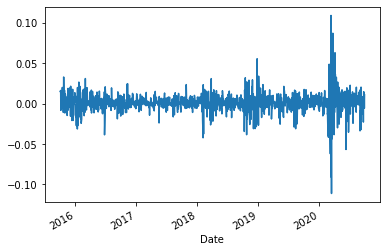

In [121]:
return_stocks_Peter['Portfolio_Daily_Return_Peter'].plot()

### Cumulative return from the Portfolio

In [122]:
Cumulative_returns_daily_Peter = (1+return_stocks_Peter).cumprod()
Cumulative_returns_daily_Peter.tail(5)

,GS,MS,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,GOOG,FB,MSFT,Portfolio_Daily_Return_Peter
Date,,,,,,,,,,,,,
2020-09-24,1.108454,1.479683,1.552753,1.684221,1.123116,1.345575,2.509733,3.949635,5.799259,2.336518,2.743595,4.554808,2.374595
2020-09-25,1.107545,1.493333,1.563379,1.679765,1.132224,1.349187,2.594117,4.097810,5.943943,2.363788,2.801759,4.658597,2.409280
2020-09-28,1.130951,1.535873,1.578942,1.676322,1.142902,1.327815,2.600377,4.195620,6.095502,2.395786,2.823749,4.694911,2.435819
2020-09-29,1.117998,1.499683,1.578405,1.658902,1.135992,1.305539,2.608267,4.163869,6.039484,2.403655,2.878395,4.646043,2.421585
2020-09-30,1.141745,1.534921,1.597939,1.680170,1.152638,1.288682,2.673613,4.226642,6.046877,2.404096,2.879604,4.714862,2.447526


In [123]:
cumreturnmean_Peter = Cumulative_returns_daily_Peter.mean()
cumreturnmean_Peter

GS                              1.178646
MS                              1.354381
JNJ                             1.385420
MRK                             1.378245
PFE                             1.139898
RHHBY                           1.008774
UNH                             1.828333
AAPL                            1.718844
AMZN                            2.741802
GOOG                            1.703168
FB                              1.799548
MSFT                            2.291658
Portfolio_Daily_Return_Peter    1.608889
dtype: float64

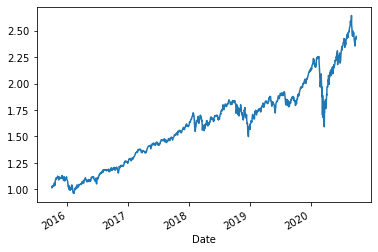

In [124]:
Cumulative_returns_daily_Peter['Portfolio_Daily_Return_Peter'].plot()

### Portfolio Risk – Portfolio Standard Deviation - Peter Portfolio 1st suggestion

In [125]:
covariance_portfolio_Peter = return_stocks_Peter.iloc[:,:-1]
covariance_portfolio_Peter = (covariance_portfolio_Peter.cov())*252

covariance_portfolio_Peter

,GS,MS,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,GOOG,FB,MSFT
GS,0.099784,0.096820,0.026971,0.030854,0.029218,0.026458,0.048206,0.051278,0.036959,0.045745,0.045590,0.050981
MS,0.096820,0.119865,0.031754,0.035117,0.035847,0.030963,0.054676,0.056905,0.040295,0.049894,0.049024,0.057219
JNJ,0.026971,0.031754,0.039117,0.025844,0.025903,0.019560,0.028522,0.024991,0.019497,0.023301,0.021727,0.028277
MRK,0.030854,0.035117,0.025844,0.049866,0.029843,0.020306,0.029463,0.026187,0.017194,0.023880,0.022858,0.029374
PFE,0.029218,0.035847,0.025903,0.029843,0.048173,0.021921,0.031337,0.026233,0.021062,0.024839,0.022993,0.029330
RHHBY,0.026458,0.030963,0.019560,0.020306,0.021921,0.046023,0.024680,0.026359,0.021094,0.023277,0.023193,0.029796
UNH,0.048206,0.054676,0.028522,0.029463,0.031337,0.024680,0.079937,0.041480,0.031256,0.037466,0.036082,0.043228
AAPL,0.051278,0.056905,0.024991,0.026187,0.026233,0.026359,0.041480,0.088408,0.051576,0.051060,0.054279,0.058348
AMZN,0.036959,0.040295,0.019497,0.017194,0.021062,0.021094,0.031256,0.051576,0.090671,0.053907,0.060285,0.056626
GOOG,0.045745,0.049894,0.023301,0.023880,0.024839,0.023277,0.037466,0.051060,0.053907,0.068777,0.058735,0.057111


In [126]:
portfolio_variance_Peter = np.dot(initial_weight_Peter.T,np.dot(covariance_portfolio_Peter, initial_weight_Peter))

In [127]:
portfolio_risk_Peter = np.sqrt(portfolio_variance_Peter)
portfolio_risk_Peter

0.20006683520806726

In [128]:
Sharpe_Ratio_Peter = (return_stocks_Peter['Portfolio_Daily_Return_Peter'].mean()-0.0075)/ return_stocks_Peter['Portfolio_Daily_Return_Peter'].std()
Sharpe_Ratio_Peter

-0.5323053812203155

In [129]:
Annualised_Sharpe_Ratio_Peter = (252**0.5)*Sharpe_Ratio_Peter
Annualised_Sharpe_Ratio_Peter

-8.450085961502317

This is just obseration all important stocks to analyse how its doing in the market. We are going to cherry picking to achieve our goals of our clients.

### 2nd Portfolio Suggestion for Mr.Peter

In [130]:
data_Peter2 = [df["AAPL"],df["AMZN"],df["MSFT"]]
Preferred_Stocks_Peter2 = pd.concat(data_Peter2, axis=1)
Preferred_Stocks_Peter2

,AAPL,AMZN,MSFT
Date,,,
2015-10-01,27.40,520.72,44.61
2015-10-02,27.59,532.54,45.57
2015-10-05,27.70,543.68,46.63
2015-10-06,27.83,537.48,46.75
2015-10-07,27.70,541.94,46.80
...,...,...,...
2020-09-24,108.22,3019.79,203.19
2020-09-25,112.28,3095.13,207.82
2020-09-28,114.96,3174.05,209.44


In [131]:
Stocks_Peter2 = ['AAPL','AMZN','MSFT']
initial_weight_Peter2 = np.array([0.334, 0.334, 0.334])

In [132]:
return_stocks_Peter2 = Preferred_Stocks_Peter2.pct_change()
return_stocks_Peter2.head(5)

,AAPL,AMZN,MSFT
Date,,,
2015-10-01,NaN,NaN,NaN
2015-10-02,0.006934,0.022699,0.021520
2015-10-05,0.003987,0.020919,0.023261
2015-10-06,0.004693,-0.011404,0.002573
2015-10-07,-0.004671,0.008298,0.001070


In [133]:
return_stocks_Peter2.describe()

,AAPL,AMZN,MSFT
count,1258.000000,1258.000000,1258.000000
mean,0.001322,0.001611,0.001387
std,0.018730,0.018969,0.017539
min,-0.128652,-0.079221,-0.147390
25%,-0.006240,-0.006716,-0.005893
50%,0.000997,0.001636,0.001225
75%,0.009879,0.010765,0.009161
max,0.119723,0.132164,0.142169


In [134]:
daily_returns_mean_Peter2 = return_stocks_Peter2.mean()
daily_returns_mean_Peter2

AAPL    0.001322
AMZN    0.001611
MSFT    0.001387
dtype: float64

In [135]:
allocated_daily_returns_Peter2 = (initial_weight_Peter2 * daily_returns_mean_Peter2)
portfolio_return_Peter2 = np.sum(allocated_daily_returns_Peter2)
print(portfolio_return_Peter2)

0.0014427480423160857


In [136]:
return_stocks_Peter2['Portfolio_Daily_Return_Peter2'] = return_stocks_Peter2.dot(initial_weight_Peter2)
return_stocks_Peter2.tail(5)

,AAPL,AMZN,MSFT,Portfolio_Daily_Return_Peter2
Date,,,,
2020-09-24,0.010269,0.006644,0.012962,0.009978
2020-09-25,0.037516,0.024949,0.022787,0.028474
2020-09-28,0.023869,0.025498,0.007795,0.019092
2020-09-29,-0.007568,-0.009190,-0.010409,-0.009074
2020-09-30,0.015076,0.001224,0.014812,0.010392


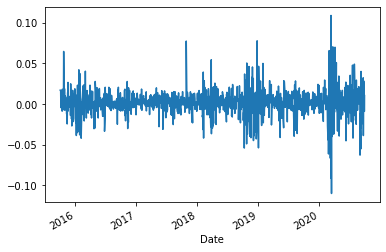

In [137]:
return_stocks_Peter2['Portfolio_Daily_Return_Peter2'].plot()

In [138]:
Cumulative_returns_daily_Peter2 = (1+return_stocks_Peter2).cumprod()
Cumulative_returns_daily_Peter2.tail(5)

,AAPL,AMZN,MSFT,Portfolio_Daily_Return_Peter2
Date,,,,
2020-09-24,3.949635,5.799259,4.554808,4.960352
2020-09-25,4.097810,5.943943,4.658597,5.101593
2020-09-28,4.195620,6.095502,4.694911,5.198993
2020-09-29,4.163869,6.039484,4.646043,5.151819
2020-09-30,4.226642,6.046877,4.714862,5.205354


In [139]:
cumreturnmean_Peter2 = Cumulative_returns_daily_Peter2.mean()
cumreturnmean_Peter2

AAPL                             1.718844
AMZN                             2.741802
MSFT                             2.291658
Portfolio_Daily_Return_Peter2    2.272802
dtype: float64

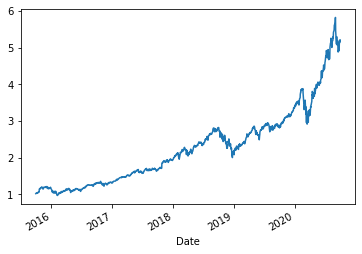

In [140]:
Cumulative_returns_daily_Peter2['Portfolio_Daily_Return_Peter2'].plot()

In [141]:
covariance_portfolio_Peter2 = return_stocks_Peter2.iloc[:,:-1]
covariance_portfolio_Peter2 = (covariance_portfolio_Peter2.cov())*252

covariance_portfolio_Peter2

,AAPL,AMZN,MSFT
AAPL,0.088408,0.051576,0.058348
AMZN,0.051576,0.090671,0.056626
MSFT,0.058348,0.056626,0.077524


In [142]:
portfolio_variance_Peter2 = np.dot(initial_weight_Peter2.T,np.dot(covariance_portfolio_Peter2, initial_weight_Peter2))

In [143]:
portfolio_risk_Peter2 = np.sqrt(portfolio_variance_Peter2)
portfolio_risk_Peter2

0.25648555379169746

In [144]:
Sharpe_Ratio_Peter2 = (return_stocks_Peter2['Portfolio_Daily_Return_Peter2'].mean()-0.0075)/ return_stocks_Peter2['Portfolio_Daily_Return_Peter2'].std()
Sharpe_Ratio_Peter2

-0.3748978935828754

In [145]:
Annualised_Sharpe_Ratio_Peter2 = (252**0.5)*Sharpe_Ratio_Peter2
Annualised_Sharpe_Ratio_Peter2

-5.951319560773476

This is high sharpe ratio, So this portfolio is good to go for high returns.

#### Expected Return from this portfolio

**Formula**: 

((Weightage of stock allocation * cumulative return of stock1 + Weightage of stock allocation * cumulative return of stock2 + Weightage of stock allocation * cumulative return of stock3)+1) * Investment Captial 

Cumulative return of AAPL = 322.7%
Cumulative return of AMZN = 504.7%
Cumulative return of MSFT = 371.5%
Investment Captial = 1000000 Dollars

((0.334 * 322.7% + 0.334 * 504.7% + 0.334 * 371.5%)+1) * 1000000 = **5004326**

In 5 years time, Patrick will get 5x returns with this portfolio with the risk of **29.2**.

#### 3rd Portfolio Suggestion for Mr.Peter

##### Profile with 2 stocks for achieving high returns

In [146]:
data_Peter3 = [df["AMZN"],df["MSFT"]]
Preferred_Stocks_Peter3 = pd.concat(data_Peter3, axis=1)
Preferred_Stocks_Peter3

,AMZN,MSFT
Date,,
2015-10-01,520.72,44.61
2015-10-02,532.54,45.57
2015-10-05,543.68,46.63
2015-10-06,537.48,46.75
2015-10-07,541.94,46.80
...,...,...
2020-09-24,3019.79,203.19
2020-09-25,3095.13,207.82
2020-09-28,3174.05,209.44


In [147]:
Stocks_Peter3 = ['AMZN','MSFT']
initial_weight_Peter3 = np.array([0.5, 0.5])

In [148]:
return_stocks_Peter3 = Preferred_Stocks_Peter3.pct_change()
return_stocks_Peter3.head(5)

,AMZN,MSFT
Date,,
2015-10-01,NaN,NaN
2015-10-02,0.022699,0.021520
2015-10-05,0.020919,0.023261
2015-10-06,-0.011404,0.002573
2015-10-07,0.008298,0.001070


In [149]:
return_stocks_Peter3.describe()

,AMZN,MSFT
count,1258.000000,1258.000000
mean,0.001611,0.001387
std,0.018969,0.017539
min,-0.079221,-0.147390
25%,-0.006716,-0.005893
50%,0.001636,0.001225
75%,0.010765,0.009161
max,0.132164,0.142169


In [150]:
daily_returns_mean_Peter3 = return_stocks_Peter3.mean()
daily_returns_mean_Peter3

AMZN    0.001611
MSFT    0.001387
dtype: float64

In [151]:
allocated_daily_returns_Peter3 = (initial_weight_Peter3 * daily_returns_mean_Peter3)
portfolio_return_Peter3 = np.sum(allocated_daily_returns_Peter3)
print(portfolio_return_Peter3)

0.0014987887350335388


In [152]:
return_stocks_Peter3['Portfolio_Daily_Return_Peter3'] = return_stocks_Peter3.dot(initial_weight_Peter3)
return_stocks_Peter3.tail(5)

,AMZN,MSFT,Portfolio_Daily_Return_Peter3
Date,,,
2020-09-24,0.006644,0.012962,0.009803
2020-09-25,0.024949,0.022787,0.023868
2020-09-28,0.025498,0.007795,0.016647
2020-09-29,-0.009190,-0.010409,-0.009799
2020-09-30,0.001224,0.014812,0.008018


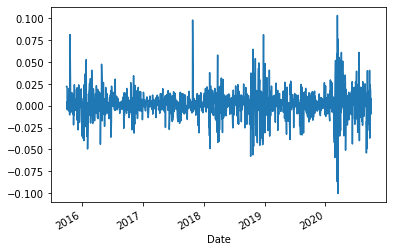

In [153]:
return_stocks_Peter3['Portfolio_Daily_Return_Peter3'].plot()

In [154]:
Cumulative_returns_daily_Peter3 = (1+return_stocks_Peter3).cumprod()
Cumulative_returns_daily_Peter3.tail(5)

,AMZN,MSFT,Portfolio_Daily_Return_Peter3
Date,,,
2020-09-24,5.799259,4.554808,5.316747
2020-09-25,5.943943,4.658597,5.443645
2020-09-28,6.095502,4.694911,5.534264
2020-09-29,6.039484,4.646043,5.480031
2020-09-30,6.046877,4.714862,5.523972


In [155]:
cumreturnmean_Peter3 = Cumulative_returns_daily_Peter3.mean()
cumreturnmean_Peter3

AMZN                             2.741802
MSFT                             2.291658
Portfolio_Daily_Return_Peter3    2.552715
dtype: float64

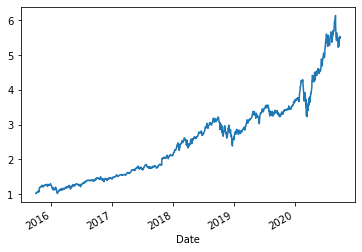

In [156]:
Cumulative_returns_daily_Peter3['Portfolio_Daily_Return_Peter3'].plot()

In [157]:
covariance_portfolio_Peter3 = return_stocks_Peter3.iloc[:,:-1]
covariance_portfolio_Peter3 = (covariance_portfolio_Peter3.cov())*252

covariance_portfolio_Peter3

,AMZN,MSFT
AMZN,0.090671,0.056626
MSFT,0.056626,0.077524


In [158]:
portfolio_variance_Peter3 = np.dot(initial_weight_Peter3.T,np.dot(covariance_portfolio_Peter3, initial_weight_Peter3))

In [159]:
portfolio_risk_Peter3 = np.sqrt(portfolio_variance_Peter3)
portfolio_risk_Peter3

0.26525750702618806

In [160]:
Sharpe_Ratio_Peter3 = (return_stocks_Peter3['Portfolio_Daily_Return_Peter3'].mean()-0.0075)/ return_stocks_Peter3['Portfolio_Daily_Return_Peter3'].std()
Sharpe_Ratio_Peter3

-0.35914638760500134

In [161]:
Annualised_Sharpe_Ratio_Peter3 = (252**0.5)*Sharpe_Ratio_Peter3
Annualised_Sharpe_Ratio_Peter3

-5.701272155220264

#### Expected Return from this portfolio

**Formula**: 

((Weightage of stock allocation * cumulative return of stock1 + Weightage of stock allocation * cumulative return of stock2)+1) * Investment Captial 

Cumulative return of AMZN = 504.7%
Cumulative return of MSFT = 371.5%
Investment Captial = 1000000 Dollars

(( 0.5 * 504.7% + 0.5 * 371.5%)+1) * 1000000 = **5381000**

In 5 years time, Patrick will get over 5.3 million with the risk of **28.95**.

By all this above analysis, with slightly lesser risk, Peter will get over 300K dollars with this portfolio. I will suggest him to prefer this portfolio.

# Patrick Jyengar Portfolio Recommendation :

We are highly recommending him to create his portfolio with **GOOGLE** & **Johnson & Johnson** stocks. If he invests **500K dollars** in this portfolio and hold it for **5 years**, He likely to get **1 million dollars with 23% risk**.

# Peter Jyengar Portfolio Recommendation :

We considered two portfolio as we saw above analysis, But I highly recommend him to create portfolio with **AMAZON** & **MSFT** stocks. If he invests **1 million dollars** and holt it for years. He likely to get **5.3 million dollars with 28.95% risk**.